# DS5220 Supervised Machine Learning Final Project

Charles Schatmeyer, April 2025

Examining the potential of Supervised Machine Learning Techniques on predicting batting outcomes from batting stances and other pitcher-independent batting factors

# Import

In [367]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.linear_model import Ridge, Lasso
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
import shap


# Load, Preprocess Data

All Data taken from BaseballSavant. Batting stance data is only present from 2023 onwards, so the 2023 and 2024 seasons are used exclusively. Batting stance data is queried with 50 Min Total Swings and 50 Min Results, All other data queried with 50 Min PA. Standard qualification is >500 Plate Appearances, though this is loosened to include more data at this point.

In [101]:
# Load StanceStats.csv
stances_data = pd.read_csv('StanceStats.csv')
# Load CustomStats.csv (Relevant stats not taken from Batting Stance Leaderboard)
batting_data = pd.read_csv('CustomStatsPlusBatting.csv')
# Load PitchTypes2023/4.csv (Pitch Specific Batting Performance Stats)
pitch_2023_data = pd.read_csv('PitchTypes2023.csv')
pitch_2024_data = pd.read_csv('PitchTypes2024.csv')

In [102]:
# Handle switch hitters in stance data
# Extract Hitters with Multiple Entries (Switch Hitters) and Single Entries
multi_entries = stances_data.groupby(['id', 'year']).filter(lambda x: len(x) > 1)
single_entries = stances_data.groupby(['id', 'year']).filter(lambda x: len(x) == 1)

# Average the numeric columns and set 'side' to 'S'
averaged = (
    multi_entries
    .groupby(['id', 'year'], as_index=False)
    .agg({
        col: 'mean' if stances_data[col].dtype != 'object' else 'first'
        for col in stances_data.columns if col not in ['side', 'name']
    })
)
averaged['side'] = 'S'

# Keep 'name' from the first entry in the original group
averaged = averaged.merge(
    stances_data[['id', 'year', 'name']].drop_duplicates(), 
    on=['id', 'year'], 
    how='left'
)

# Combine switch hitters and single entries
stances_data = pd.concat([single_entries, averaged], ignore_index=True)

In [103]:
# get hr_percent from home_run / ab, hbp_percent from b_hit_by_pitch / pa
batting_data['hr_percent'] = batting_data['home_run'] / batting_data['ab']
batting_data['hbp_percent'] = batting_data['b_hit_by_pitch'] / batting_data['pa']

In [104]:
# Inner join on player_id from batting_data + id from stances_data, year from both
batting_data = batting_data.rename(columns={'player_id': 'id'})
data = stances_data.merge(batting_data, how='inner', left_on=['id', 'year'], right_on=['id', 'year'])

In [105]:
# Setup, Merge Pitch Data
# Add year column
pitch_2023_data['year'] = 2023.0
pitch_2024_data['year'] = 2024.0
# Rename, remove columns from pitch data
pitch_2023_data = pitch_2023_data.rename(columns={'player_id': 'id'})
pitch_2024_data = pitch_2024_data.rename(columns={'player_id': 'id'})
pitch_2023_data = pitch_2023_data[['id', 'year', 'pitch_type', 'pitches', 'run_value_per_100', 'slg', 'woba', 'whiff_percent', 'k_percent']]
pitch_2024_data = pitch_2024_data[['id', 'year', 'pitch_type', 'pitches', 'run_value_per_100', 'slg', 'woba', 'whiff_percent', 'k_percent']]
# Pivot pitch_2023/2024_data so that each pitch type is a column
pitch_2023_data = pitch_2023_data.pivot_table(index=['id', 'year'], columns='pitch_type', values=['pitches', 'run_value_per_100', 'slg', 'woba', 'whiff_percent', 'k_percent'])
pitch_2024_data = pitch_2024_data.pivot_table(index=['id', 'year'], columns='pitch_type', values=['pitches', 'run_value_per_100', 'slg', 'woba', 'whiff_percent', 'k_percent'])
# Flatten the multi-level columns
pitch_2023_data.columns = [f"{metric}_{pitch}" for metric, pitch in pitch_2023_data.columns]
pitch_2024_data.columns = [f"{metric}_{pitch}" for metric, pitch in pitch_2024_data.columns]
# Reset index
pitch_2023_data = pitch_2023_data.reset_index()
pitch_2024_data = pitch_2024_data.reset_index()
# Set id as numeric
pitch_2023_data['id'] = pd.to_numeric(pitch_2023_data['id'])
pitch_2024_data['id'] = pd.to_numeric(pitch_2024_data['id'])

In [106]:
# Combine pitch years
pitch_data = pd.concat([pitch_2023_data, pitch_2024_data], ignore_index=True)
# Merge pitch data with main data
data = data.merge(pitch_data, how='left', on=['id', 'year'])

In [107]:
# Get count of missing values from columns formatted as 'pitches_'
missing_columns = [col for col in data.columns if col.startswith('pitches_')]
missing_values = data[missing_columns].isnull().sum()
# Print missing values
print("Missing values in pitch data:")
print(missing_values)

Missing values in pitch data:
pitches_CH    163
pitches_CU    231
pitches_FC    238
pitches_FF      2
pitches_FS    693
pitches_SI     84
pitches_SL     87
pitches_ST    313
dtype: int64


In [108]:
# Remove columns with suffix _FS and _ST (Splitters and Sweepers, Rare Pitches with limited data)
data = data.loc[:, ~data.columns.str.endswith(('_FS', '_ST'))]

In [ ]:
# Get % Change based on pitch type for Whiff%, K%, SLG, wOBA compared to General Case
pitch_types = ['CH', 'CU', 'FC', 'FF', 'SI', 'SL']
for pitch in pitch_types:
    data[f'whiff_percent_change_{pitch}'] = (data[f'whiff_percent_{pitch}'] - data['whiff_percent']) / data['whiff_percent']
    data[f'k_percent_change_{pitch}'] = (data[f'k_percent_{pitch}'] - data['k_percent']) / data['k_percent']
    data[f'slg_change_{pitch}'] = (data[f'slg_{pitch}'] - data['slg_percent']) / data['slg_percent']
    data[f'woba_change_{pitch}'] = (data[f'woba_{pitch}'] - data['woba']) / data['woba']


In [110]:
# drop unnecessary columns id, last_name, first_name
data = data.drop(columns=['id', 'last_name, first_name'])

In [111]:
# Reorder columns to be descriptors, then batting stance stats, then batting swing stats, then batting performance, then pitch specific stats
columns_in_order = ['name', 'year', 'pa', 'ab', 'side', # Descriptors
                    'avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 
                    'avg_stance_angle', 'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate', # Stance Stats
                    'avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                    'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent', 
                    'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent', # Swing Stats
                    'home_run', 'k_percent', 'batting_avg', 'slg_percent', 'on_base_percent', 'on_base_plus_slg', 'isolated_power', 
                    'babip', 'b_hit_by_pitch', 'woba', 'hr_percent', 'hbp_percent', # Batting Performance
                    'k_percent_CH', 'k_percent_CU', 'k_percent_FC', 'k_percent_FF', 'k_percent_SI', 'k_percent_SL', 
                    'pitches_CH', 'pitches_CU', 'pitches_FC', 'pitches_FF', 'pitches_SI', 'pitches_SL', 'run_value_per_100_CH', 
                    'run_value_per_100_CU', 'run_value_per_100_FC', 'run_value_per_100_FF', 'run_value_per_100_SI', 'run_value_per_100_SL', 
                    'slg_CH', 'slg_CU', 'slg_FC', 'slg_FF', 'slg_SI', 'slg_SL', 'whiff_percent_CH', 'whiff_percent_CU', 'whiff_percent_FC', 
                    'whiff_percent_FF', 'whiff_percent_SI', 'whiff_percent_SL', 'woba_CH', 'woba_CU', 'woba_FC', 'woba_FF', 'woba_SI', 'woba_SL', 
                    'whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH', 'woba_change_CH', 'whiff_percent_change_CU', 
                    'k_percent_change_CU', 'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC', 'k_percent_change_FC', 'slg_change_FC', 
                    'woba_change_FC', 'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF', 'woba_change_FF', 
                    'whiff_percent_change_SI', 'k_percent_change_SI', 'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL', 
                    'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL'] # Pitch Specific Stats

data = data[columns_in_order]

In [112]:
# rename non-descriptive columns
data = data.rename(columns={
    'pa': 'plate_appearances',
    'ab': 'at_bats',
    'babip': 'batting_average_balls_in_play',
})

In [113]:
# get data of only players with above 500 plate appearances
data_qualified = data[data['plate_appearances'] > 500]

In [114]:
# print sizes
print(f"Full data size: {data.shape}")
print(f"Qualified data size (>500 Plate Appearances): {data_qualified.shape}")

Full data size: (993, 97)
Qualified data size (>500 Plate Appearances): (266, 97)


In [115]:
data.head()

,name,year,plate_appearances,at_bats,side,avg_batter_y_position,avg_batter_x_position,avg_foot_sep,avg_stance_angle,avg_intercept_y_vs_batter,...,slg_change_FF,woba_change_FF,whiff_percent_change_SI,k_percent_change_SI,slg_change_SI,woba_change_SI,whiff_percent_change_SL,k_percent_change_SL,slg_change_SL,woba_change_SL
0,"Tovar, Ezequiel",2024.0,695,655,R,27.105602,24.763704,38.615167,0.476736,29.283943,...,-0.219616,-0.138889,-0.352239,-0.506944,0.076759,0.052469,0.161194,0.135417,0.095949,0.052469
1,"Ohtani, Shohei",2024.0,731,636,L,29.269829,29.987090,33.355636,-9.306437,26.899398,...,-0.065015,0.002320,-0.526846,-0.306306,-0.103715,0.046404,0.345638,0.189189,0.278638,0.139211
2,"Olson, Matt",2024.0,685,600,L,30.527979,30.048285,30.423949,-8.466048,33.390119,...,0.013129,0.061947,-0.463878,-0.278226,0.260394,0.135693,0.231939,0.298387,-0.109409,-0.073746
3,"Hernández, Teoscar",2024.0,652,589,R,31.170344,29.346458,27.274617,-0.978789,29.702244,...,-0.077844,-0.016667,-0.476471,-0.548611,-0.067864,0.130556,0.350000,0.263889,-0.137725,-0.205556
4,"Adames, Willy",2024.0,688,610,R,32.247764,31.600320,33.719579,4.054310,30.362518,...,-0.181818,-0.108187,-0.433898,-0.406375,0.056277,0.108187,0.196610,-0.135458,0.335498,0.254386


In [116]:
data_qualified.head()

,name,year,plate_appearances,at_bats,side,avg_batter_y_position,avg_batter_x_position,avg_foot_sep,avg_stance_angle,avg_intercept_y_vs_batter,...,slg_change_FF,woba_change_FF,whiff_percent_change_SI,k_percent_change_SI,slg_change_SI,woba_change_SI,whiff_percent_change_SL,k_percent_change_SL,slg_change_SL,woba_change_SL
0,"Tovar, Ezequiel",2024.0,695,655,R,27.105602,24.763704,38.615167,0.476736,29.283943,...,-0.219616,-0.138889,-0.352239,-0.506944,0.076759,0.052469,0.161194,0.135417,0.095949,0.052469
1,"Ohtani, Shohei",2024.0,731,636,L,29.269829,29.987090,33.355636,-9.306437,26.899398,...,-0.065015,0.002320,-0.526846,-0.306306,-0.103715,0.046404,0.345638,0.189189,0.278638,0.139211
2,"Olson, Matt",2024.0,685,600,L,30.527979,30.048285,30.423949,-8.466048,33.390119,...,0.013129,0.061947,-0.463878,-0.278226,0.260394,0.135693,0.231939,0.298387,-0.109409,-0.073746
3,"Hernández, Teoscar",2024.0,652,589,R,31.170344,29.346458,27.274617,-0.978789,29.702244,...,-0.077844,-0.016667,-0.476471,-0.548611,-0.067864,0.130556,0.350000,0.263889,-0.137725,-0.205556
4,"Adames, Willy",2024.0,688,610,R,32.247764,31.600320,33.719579,4.054310,30.362518,...,-0.181818,-0.108187,-0.433898,-0.406375,0.056277,0.108187,0.196610,-0.135458,0.335498,0.254386


The dataset has 4 Descriptive Columns, 9 Predictor Columns, and Many Target Columns. General offensive batting performance can be measured with On Base Plus Slugging, or OPS, but other targets are included for a more thorough analysis.

# EDA

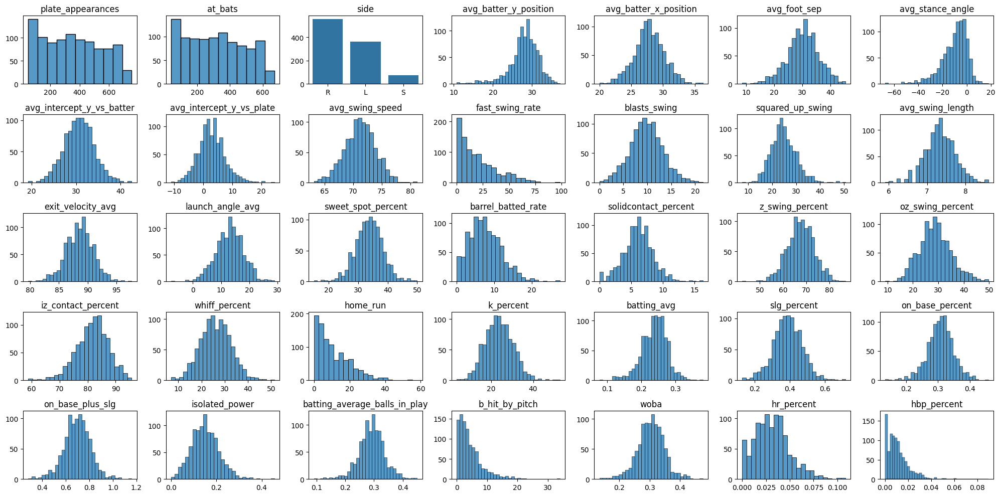

In [304]:
# Plot distribution of variables, excluding pitch specific stats
# 7x5 Subplots, loop over each column and plot histogram distribution
fig, axs = plt.subplots(5, 7, figsize=(20, 10))
axs = axs.flatten()
# Loop through each column and plot
for i, col in enumerate(data.columns[2:37]):
    if data[col].dtype == 'object':
        # Plot categorical data
        sns.countplot(data=data, x=col, ax=axs[i])
    else:
        # Plot numerical data
        sns.histplot(data=data, x=col, ax=axs[i])
    axs[i].set_title(col)
    axs[i].set_xlabel('')
    axs[i].set_ylabel('')
plt.tight_layout()
plt.show()

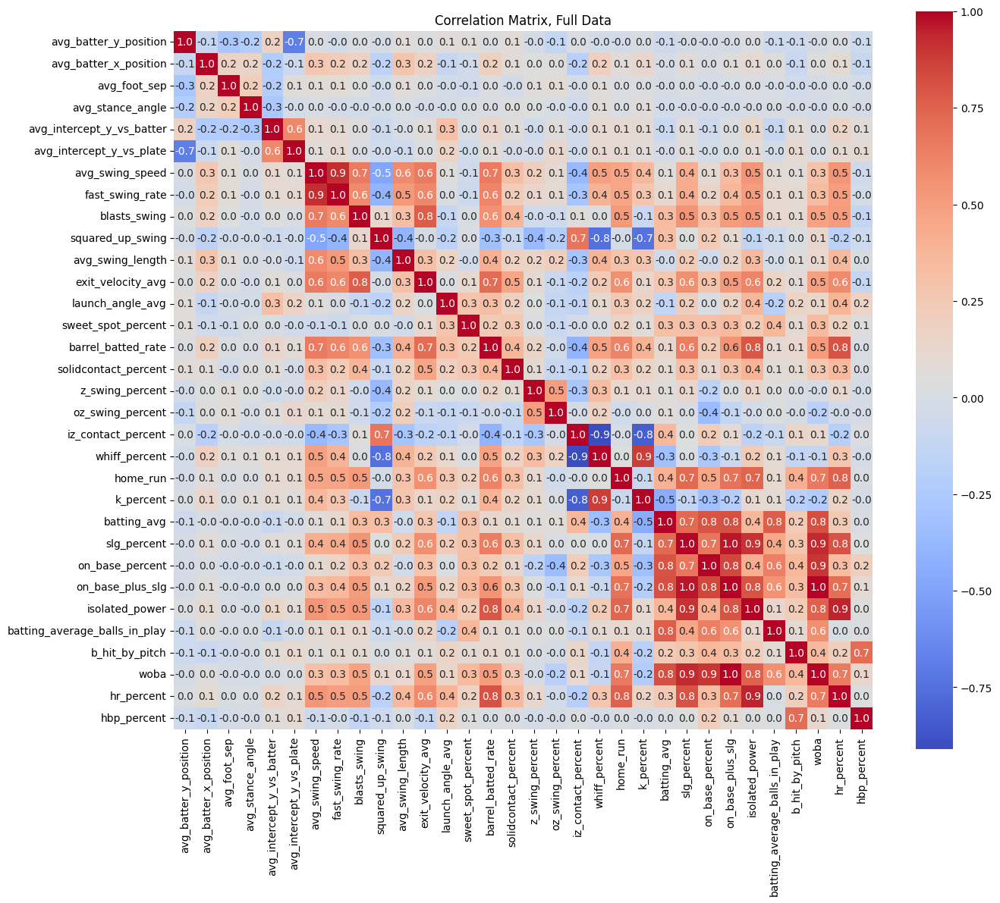

In [66]:
# Correlation matrix of columns (excluding pitch specific)
correlation_matrix = data.iloc[:, 5:37].corr()
# Plot
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, fmt=".1f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix, Full Data')
plt.tight_layout()
plt.show()

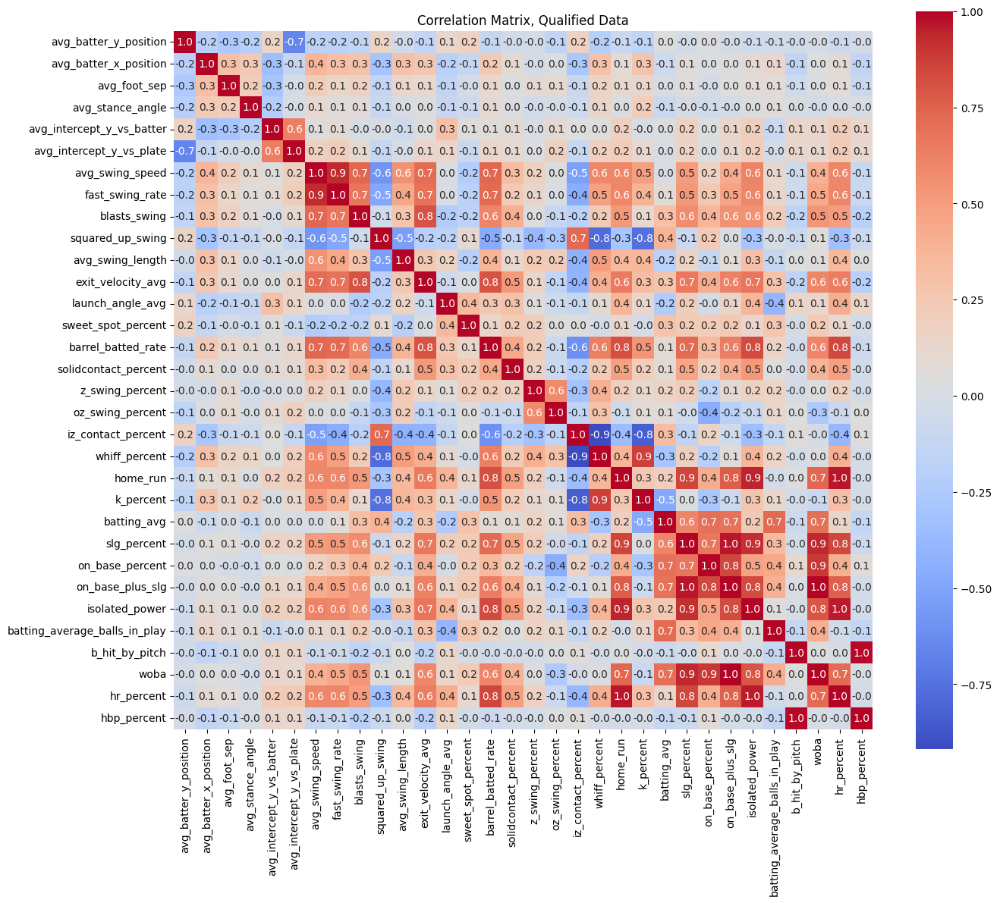

In [67]:
# Correlation matrix of qualified data
correlation_matrix_qual = data_qualified.iloc[:, 5:37].corr()
# Plot
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix_qual, annot=True, fmt=".1f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix, Qualified Data')
plt.tight_layout()
plt.show()

# Stance Predicting Hit by Pitch

Seeing if the rate of hit by pitch outcomes can be predicted by stance alone.

## Setup

In [117]:
# Keep only stance, hit by pitch related columns
hbp_columns = ['side', 'avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle', 'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate',
               'b_hit_by_pitch', 'hbp_percent']
hbp_data = data[hbp_columns]
hbp_data_qualified = data_qualified[hbp_columns]

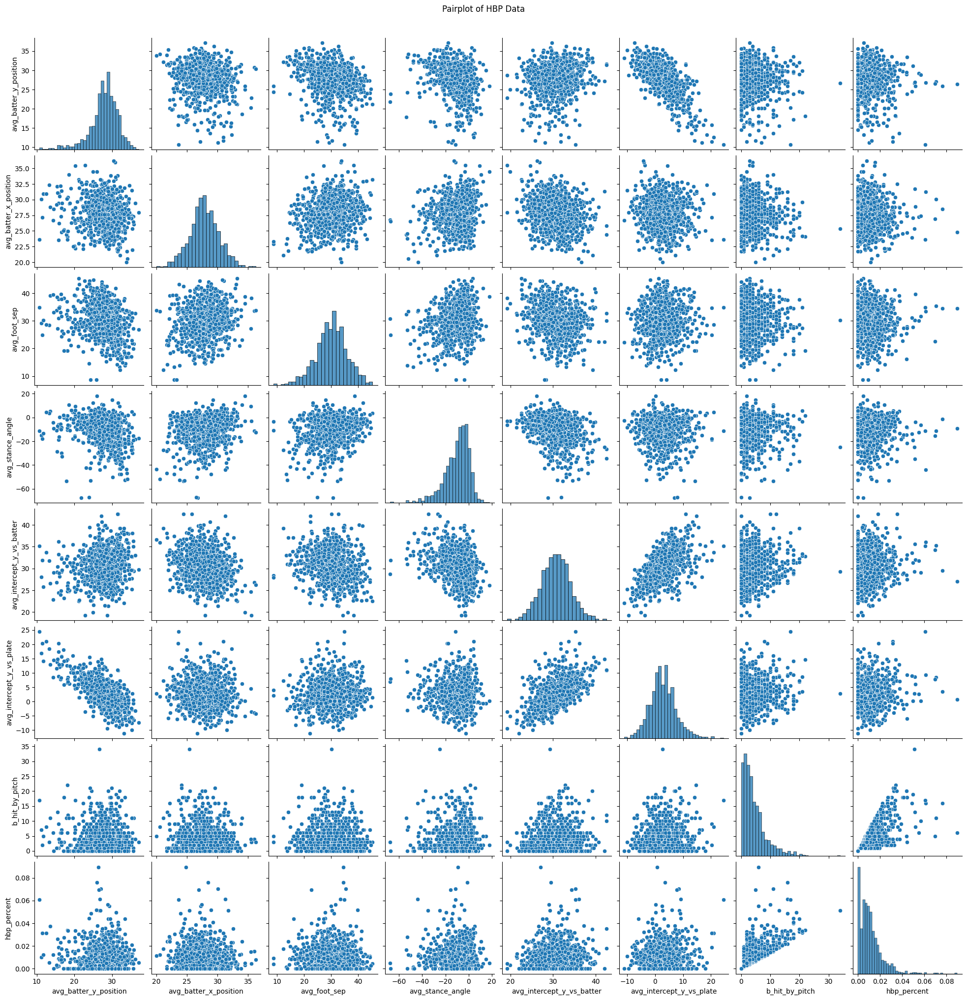

In [118]:
# plot pairs plot for hbp_data
sns.pairplot(hbp_data)
plt.suptitle('Pairplot of HBP Data', y=1.02)
plt.show()

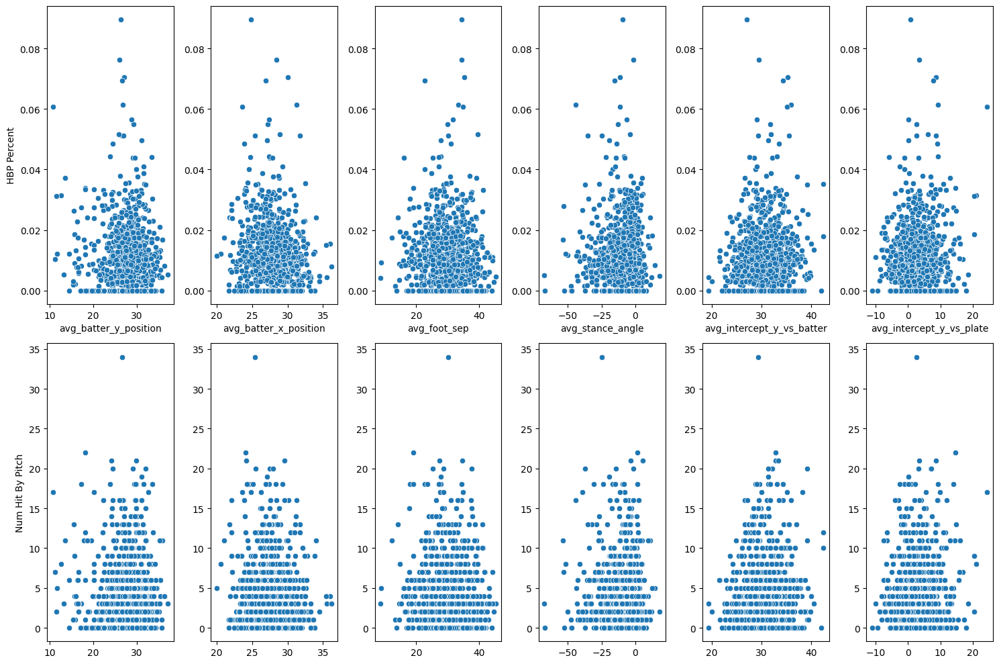

In [119]:
# Make scatterplots of hbp_percent and b_hit_by_pitch vs hbp_columns
hbp_factors = ['side', 'avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle', 'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']
fig, axs = plt.subplots(2, 6, figsize=(15, 10))
axs = axs.flatten()
# Loop through each column and plot
for i, col in enumerate(hbp_factors[1:]):
    # Plot hbp_percent vs column
    sns.scatterplot(data=hbp_data, x=col, y='hbp_percent', ax=axs[i])
    axs[i].set_xlabel(col)
    axs[i].set_ylabel('')
    # Plot b_hit_by_pitch vs column
    sns.scatterplot(data=hbp_data, x=col, y='b_hit_by_pitch', ax=axs[i+6])
    axs[i+6].set_xlabel('')
    axs[i+6].set_ylabel('')
axs[0].set_ylabel('HBP Percent')
axs[6].set_ylabel('Num Hit By Pitch')
plt.tight_layout()
plt.show()

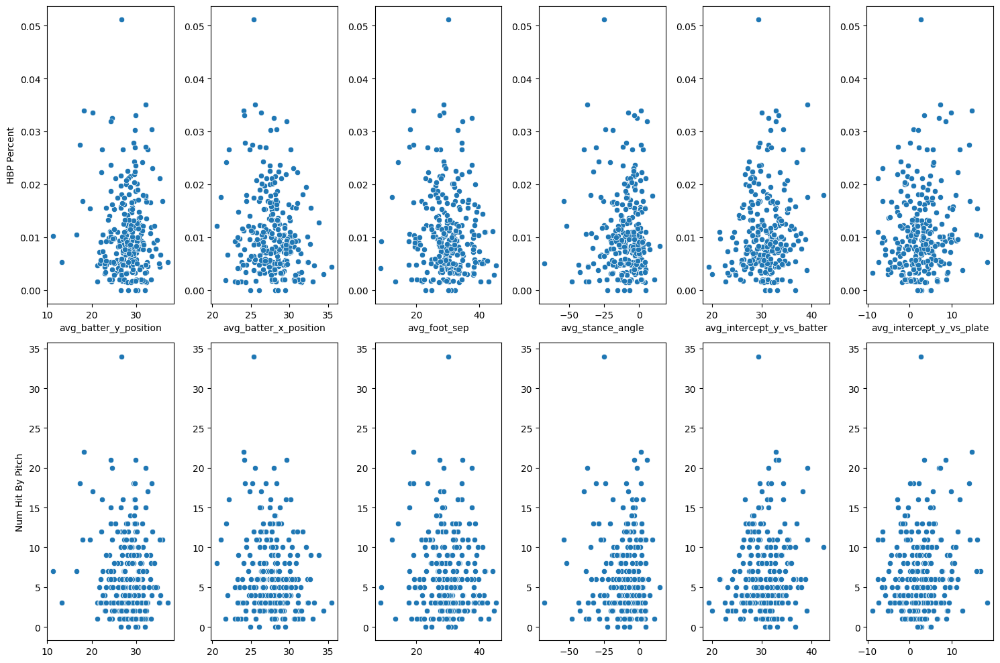

In [120]:
# Make scatterplots of hbp_percent and b_hit_by_pitch vs hbp_columns, for qualified data
hbp_factors = ['side', 'avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle', 'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']
fig, axs = plt.subplots(2, 6, figsize=(15, 10))
axs = axs.flatten()
# Loop through each column and plot
for i, col in enumerate(hbp_factors[1:]):
    # Plot hbp_percent vs column
    sns.scatterplot(data=hbp_data_qualified, x=col, y='hbp_percent', ax=axs[i])
    axs[i].set_xlabel(col)
    axs[i].set_ylabel('')
    # Plot b_hit_by_pitch vs column
    sns.scatterplot(data=hbp_data_qualified, x=col, y='b_hit_by_pitch', ax=axs[i+6])
    axs[i+6].set_xlabel('')
    axs[i+6].set_ylabel('')
axs[0].set_ylabel('HBP Percent')
axs[6].set_ylabel('Num Hit By Pitch')
plt.tight_layout()
plt.show()

In [121]:
# One-hot encoding for 'side' column
hbp_data = pd.get_dummies(hbp_data, columns=['side'], drop_first=True)
hbp_data_qualified = pd.get_dummies(hbp_data_qualified, columns=['side'], drop_first=True)
# Convert boolean side columns to numeric
hbp_data['side_R'] = hbp_data['side_R'].astype(int)
hbp_data['side_S'] = hbp_data['side_S'].astype(int)
hbp_data_qualified['side_R'] = hbp_data_qualified['side_R'].astype(int)
hbp_data_qualified['side_S'] = hbp_data_qualified['side_S'].astype(int)

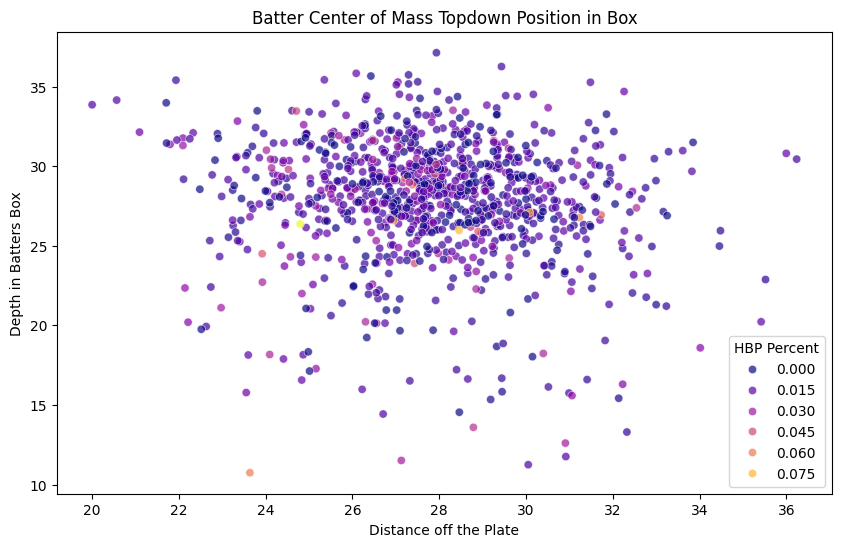

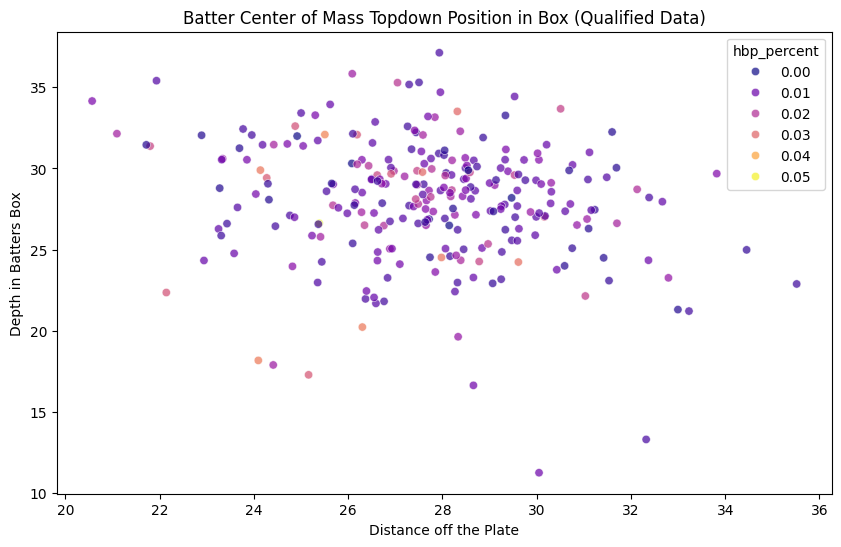

In [122]:
# Plot scatterplot of avg_batter_x_position vs avg_batter_y_position, hue is hbp_percent
plt.figure(figsize=(10, 6))
sns.scatterplot(data=hbp_data, x='avg_batter_x_position', y='avg_batter_y_position', hue='hbp_percent', palette='plasma', alpha=0.7)
plt.title('Batter Center of Mass Topdown Position in Box')
plt.xlabel('Distance off the Plate')
plt.ylabel('Depth in Batters Box')
plt.legend(title='HBP Percent', loc='lower right')
plt.show()
# Repeat for qualified data
plt.figure(figsize=(10, 6))
sns.scatterplot(data=hbp_data_qualified, x='avg_batter_x_position', y='avg_batter_y_position', hue='hbp_percent', palette='plasma', alpha=0.7)
plt.title('Batter Center of Mass Topdown Position in Box (Qualified Data)')
plt.xlabel('Distance off the Plate')
plt.ylabel('Depth in Batters Box')
plt.show()

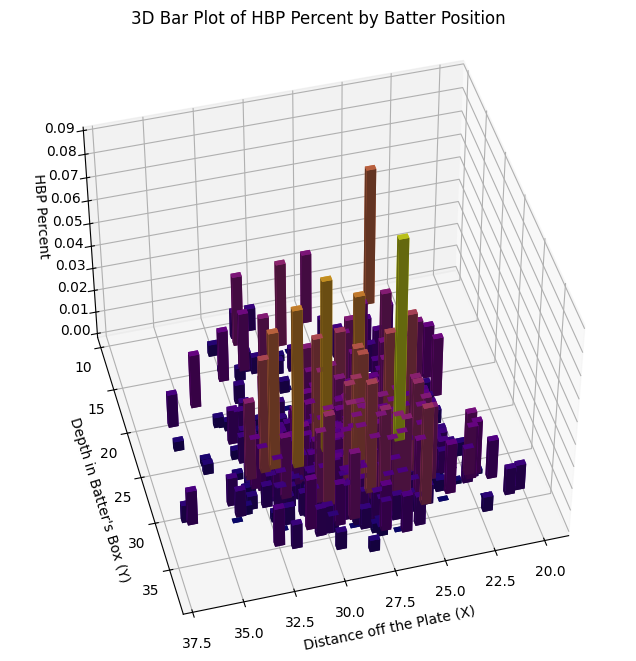

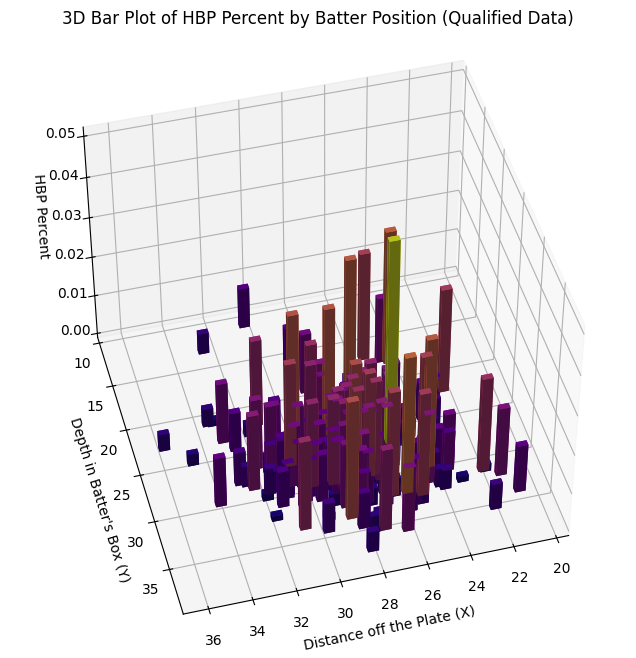

In [123]:
# 3D bar plot for hbp_data
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Extract data
x = hbp_data['avg_batter_x_position']
y = hbp_data['avg_batter_y_position']
z = np.zeros_like(x)  # Base of the bars
dx = dy = 0.5  # Width and depth of the bars
dz = hbp_data['hbp_percent']  # Height of the bars

# Plot the bars
ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=plt.cm.plasma(dz / dz.max()))

# Set labels and title
ax.set_title('3D Bar Plot of HBP Percent by Batter Position')
ax.set_xlabel('Distance off the Plate (X)')
ax.set_ylabel('Depth in Batter\'s Box (Y)')
ax.set_zlabel('HBP Percent')

# Adjust the viewing angle
ax.view_init(elev=45, azim=75)

plt.show()

# Repeat for qualified data
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Extract data
x = hbp_data_qualified['avg_batter_x_position']
y = hbp_data_qualified['avg_batter_y_position']
z = np.zeros_like(x)  # Base of the bars
dz = hbp_data_qualified['hbp_percent']  # Height of the bars

# Plot the bars
ax.bar3d(x, y, z, dx, dy, dz, shade=True, color=plt.cm.plasma(dz / dz.max()))

# Set labels and title
ax.set_title('3D Bar Plot of HBP Percent by Batter Position (Qualified Data)')
ax.set_xlabel('Distance off the Plate (X)')
ax.set_ylabel('Depth in Batter\'s Box (Y)')
ax.set_zlabel('HBP Percent')

# Adjust the viewing angle
ax.view_init(elev=45, azim=75)

plt.show()

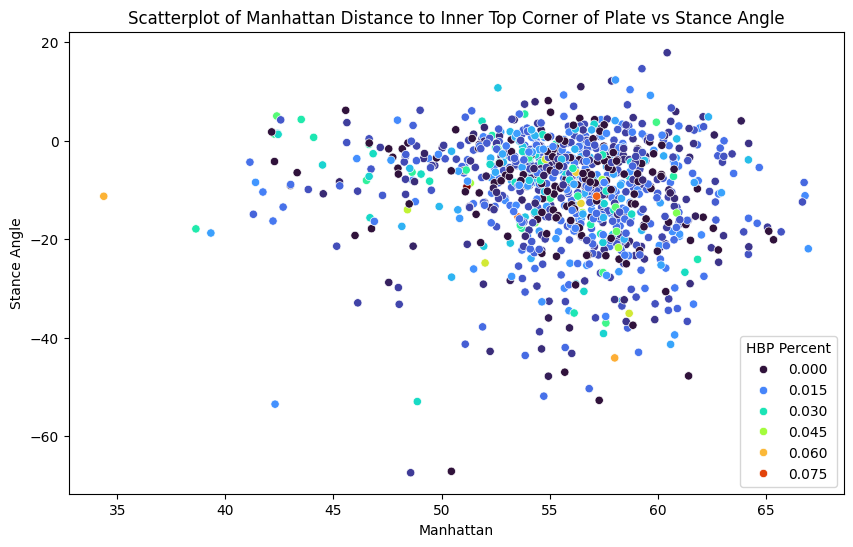

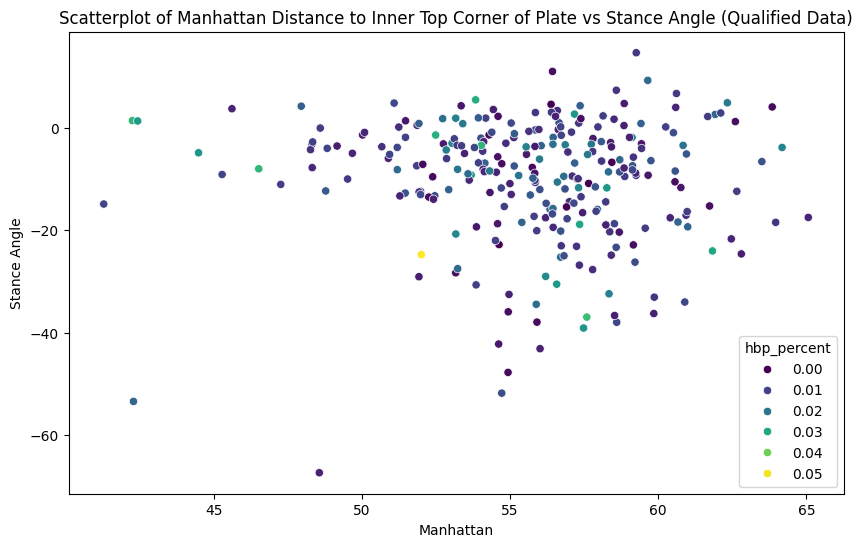

In [124]:
hbp_data_copy = hbp_data.copy()
hbp_data_copy_qualified = hbp_data_qualified.copy()
hbp_data_copy['manhattan'] = hbp_data_copy['avg_batter_x_position'] + hbp_data_copy['avg_batter_y_position']
hbp_data_copy_qualified['manhattan'] = hbp_data_copy_qualified['avg_batter_x_position'] + hbp_data_copy_qualified['avg_batter_y_position']
# Plot scatterplot of manhattan vs stance angle, hue is hbp_percent
plt.figure(figsize=(10, 6))
# make palette full spectrum
sns.scatterplot(data=hbp_data_copy, x='manhattan', y='avg_stance_angle', hue='hbp_percent', palette='turbo')
plt.title('Scatterplot of Manhattan Distance to Inner Top Corner of Plate vs Stance Angle')
plt.xlabel('Manhattan')
plt.ylabel('Stance Angle')
plt.legend(title='HBP Percent', loc='lower right')
plt.show()
# repeat for qualified data
plt.figure(figsize=(10, 6))
sns.scatterplot(data=hbp_data_copy_qualified, x='manhattan', y='avg_stance_angle', hue='hbp_percent', palette='viridis')
plt.title('Scatterplot of Manhattan Distance to Inner Top Corner of Plate vs Stance Angle (Qualified Data)')
plt.xlabel('Manhattan')
plt.ylabel('Stance Angle')
plt.show()

## Linear Regression

In [125]:
# Train-test split
# Full
X = hbp_data.drop(columns=['hbp_percent', 'b_hit_by_pitch'])
y = hbp_data['hbp_percent']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Qualified
X_q = hbp_data_qualified.drop(columns=['hbp_percent', 'b_hit_by_pitch'])
y_q = hbp_data_qualified['hbp_percent']
X_q_train, X_q_test, y_q_train, y_q_test = train_test_split(X_q, y_q, test_size=0.2, random_state=42)

In [126]:
# Standard Scalar on the Data
scaler = StandardScaler()
scaler_q = StandardScaler()

# Define the binary columns to exclude from scaling
binary_cols = ['side_R', 'side_S']

# Separate binary columns
X_train_sides = X_train[binary_cols]
X_test_sides = X_test[binary_cols]
X_q_train_sides = X_q_train[binary_cols]
X_q_test_sides = X_q_test[binary_cols]

# Drop binary columns from the features to scale
X_train_scaled_part = X_train.drop(columns=binary_cols)
X_test_scaled_part = X_test.drop(columns=binary_cols)
X_q_train_scaled_part = X_q_train.drop(columns=binary_cols)
X_q_test_scaled_part = X_q_test.drop(columns=binary_cols)

# Fit scalers
scaler = StandardScaler().fit(X_train_scaled_part)
scaler_q = StandardScaler().fit(X_q_train_scaled_part)

# Transform the data
X_train_scaled = scaler.transform(X_train_scaled_part)
X_test_scaled = scaler.transform(X_test_scaled_part)
X_q_train_scaled = scaler_q.transform(X_q_train_scaled_part)
X_q_test_scaled = scaler_q.transform(X_q_test_scaled_part)

# Convert back to DataFrames and re-attach binary columns
X_train = pd.DataFrame(X_train_scaled, columns=X_train_scaled_part.columns, index=X_train.index)
X_test = pd.DataFrame(X_test_scaled, columns=X_test_scaled_part.columns, index=X_test.index)
X_q_train = pd.DataFrame(X_q_train_scaled, columns=X_q_train_scaled_part.columns, index=X_q_train.index)
X_q_test = pd.DataFrame(X_q_test_scaled, columns=X_q_test_scaled_part.columns, index=X_q_test.index)

# Add back the binary columns
X_train[binary_cols] = X_train_sides
X_test[binary_cols] = X_test_sides
X_q_train[binary_cols] = X_q_train_sides
X_q_test[binary_cols] = X_q_test_sides


In [127]:
# Linear regression for hbp_data
# Add constant to X_train/X_test
X_train_const = sm.add_constant(X_train)
X_test_const = sm.add_constant(X_test)
# Fit model
ols_model = sm.OLS(y_train, X_train_const).fit()
print(ols_model.summary())
# Evaluate on test set
y_pred = ols_model.predict(X_test_const)
print(f"OLS Test R2: {r2_score(y_test, y_pred):.3f}")

                            OLS Regression Results                            
Dep. Variable:            hbp_percent   R-squared:                       0.043
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     4.424
Date:                Mon, 14 Apr 2025   Prob (F-statistic):           2.97e-05
Time:                        12:49:25   Log-Likelihood:                 2507.2
No. Observations:                 794   AIC:                            -4996.
Df Residuals:                     785   BIC:                            -4954.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [128]:
# Linear regression for hbp_data_qualified
X_q_train_const = sm.add_constant(X_q_train)
X_q_test_const = sm.add_constant(X_q_test)
ols_model_q = sm.OLS(y_q_train, X_q_train_const).fit()
print(ols_model_q.summary())
y_q_pred = ols_model_q.predict(X_q_test_const)
print(f"Qualified OLS Test R2: {r2_score(y_q_test, y_q_pred):.3f}")

                            OLS Regression Results                            
Dep. Variable:            hbp_percent   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     1.438
Date:                Mon, 14 Apr 2025   Prob (F-statistic):              0.182
Time:                        12:49:25   Log-Likelihood:                 725.73
No. Observations:                 212   AIC:                            -1433.
Df Residuals:                     203   BIC:                            -1403.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [129]:
# Random Forest Regressor for hbp_data
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

print(f"Random Forest Regressor - MAE: {mean_absolute_error(y_test, y_pred_rf):.3f}, "
      f"MSE: {mean_squared_error(y_test, y_pred_rf):.3f}, R2: {r2_score(y_test, y_pred_rf):.3f}")

rf_importances = pd.DataFrame(rf.feature_importances_, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
print(rf_importances)

Random Forest Regressor - MAE: 0.008, MSE: 0.000, R2: -0.110
                           importance
avg_batter_x_position        0.197112
avg_intercept_y_vs_plate     0.169929
avg_batter_y_position        0.165457
avg_foot_sep                 0.161177
avg_stance_angle             0.143885
avg_intercept_y_vs_batter    0.130737
side_R                       0.026601
side_S                       0.005102


In [130]:
# Random Forest Regressor for hbp_data_qualified
rf_q = RandomForestRegressor(n_estimators=100, random_state=42)
rf_q.fit(X_q_train, y_q_train)
y_q_pred_rf = rf_q.predict(X_q_test)

print(f"Qualified RF Regressor - MAE: {mean_absolute_error(y_q_test, y_q_pred_rf):.3f}, "
      f"MSE: {mean_squared_error(y_q_test, y_q_pred_rf):.3f}, R2: {r2_score(y_q_test, y_q_pred_rf):.3f}")

rf_q_importances = pd.DataFrame(rf_q.feature_importances_, index=X_q.columns, columns=['importance']).sort_values('importance', ascending=False)
print(rf_q_importances)

Qualified RF Regressor - MAE: 0.006, MSE: 0.000, R2: -0.349
                           importance
avg_batter_x_position        0.192158
avg_batter_y_position        0.179867
avg_intercept_y_vs_batter    0.165105
avg_foot_sep                 0.160501
avg_stance_angle             0.149695
avg_intercept_y_vs_plate     0.125249
side_R                       0.017688
side_S                       0.009737


## Logistic Regression

In [294]:
# Create binary target for high HBP (Above 75th percentile for all)
hbp_data['hbp_percent_high'] = (hbp_data['hbp_percent'] > hbp_data['hbp_percent'].quantile(0.75)).astype(int)
hbp_data_qualified['hbp_percent_high'] = (hbp_data_qualified['hbp_percent'] > hbp_data_qualified['hbp_percent'].quantile(0.75)).astype(int)

In [295]:
# Setup, Train-test split
X_log = hbp_data.drop(columns=['hbp_percent', 'b_hit_by_pitch', 'hbp_percent_high'])
y_log = hbp_data['hbp_percent_high']
X_log_train, X_log_test, y_log_train, y_log_test = train_test_split(X_log, y_log, test_size=0.2, random_state=42)
X_log_q = hbp_data_qualified.drop(columns=['hbp_percent', 'b_hit_by_pitch', 'hbp_percent_high'])
y_log_q = hbp_data_qualified['hbp_percent_high']
X_log_q_train, X_log_q_test, y_log_q_train, y_log_q_test = train_test_split(X_log_q, y_log_q, test_size=0.2, random_state=42)

In [296]:
# Standard Scalar on the Data
scaler_log = StandardScaler()
scaler_log_q = StandardScaler()
# Define the binary columns to exclude from scaling
binary_cols_log = ['side_R', 'side_S']
# Separate binary columns
X_log_train_sides = X_log_train[binary_cols_log]
X_log_test_sides = X_log_test[binary_cols_log]
X_log_q_train_sides = X_log_q_train[binary_cols_log]
X_log_q_test_sides = X_log_q_test[binary_cols_log]
# Drop binary columns from the features to scale
X_log_train_scaled_part = X_log_train.drop(columns=binary_cols_log)
X_log_test_scaled_part = X_log_test.drop(columns=binary_cols_log)
X_log_q_train_scaled_part = X_log_q_train.drop(columns=binary_cols_log)
X_log_q_test_scaled_part = X_log_q_test.drop(columns=binary_cols_log)
# Fit scalers
scaler_log = StandardScaler().fit(X_log_train_scaled_part)
scaler_log_q = StandardScaler().fit(X_log_q_train_scaled_part)
# Transform the data
X_log_train_scaled = scaler_log.transform(X_log_train_scaled_part)
X_log_test_scaled = scaler_log.transform(X_log_test_scaled_part)
X_log_q_train_scaled = scaler_log_q.transform(X_log_q_train_scaled_part)
X_log_q_test_scaled = scaler_log_q.transform(X_log_q_test_scaled_part)
# Convert back to DataFrames and re-attach binary columns
X_log_train = pd.DataFrame(X_log_train_scaled, columns=X_log_train_scaled_part.columns, index=X_log_train.index)
X_log_test = pd.DataFrame(X_log_test_scaled, columns=X_log_test_scaled_part.columns, index=X_log_test.index)
X_log_q_train = pd.DataFrame(X_log_q_train_scaled, columns=X_log_q_train_scaled_part.columns, index=X_log_q_train.index)
X_log_q_test = pd.DataFrame(X_log_q_test_scaled, columns=X_log_q_test_scaled_part.columns, index=X_log_q_test.index)
# Add back the binary columns
X_log_train[binary_cols_log] = X_log_train_sides
X_log_test[binary_cols_log] = X_log_test_sides
X_log_q_train[binary_cols_log] = X_log_q_train_sides
X_log_q_test[binary_cols_log] = X_log_q_test_sides


In [297]:
# Logistic regression for hbp_data
X_log_train_const = sm.add_constant(X_log_train)
X_log_test_const = sm.add_constant(X_log_test)
logit_model = sm.Logit(y_log_train, X_log_train_const).fit()
print(logit_model.summary())

Optimization terminated successfully.
         Current function value: 0.543680
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:       hbp_percent_high   No. Observations:                  794
Model:                          Logit   Df Residuals:                      785
Method:                           MLE   Df Model:                            8
Date:                Tue, 15 Apr 2025   Pseudo R-squ.:                 0.03671
Time:                        16:15:32   Log-Likelihood:                -431.68
converged:                       True   LL-Null:                       -448.13
Covariance Type:            nonrobust   LLR p-value:                 6.407e-05
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -1.2715      0.143     -8.865      0.000      -1.

In [298]:
# Logistic regression for hbp_data_qualified
X_log_q_train_const = sm.add_constant(X_log_q_train)
X_log_q_test_const = sm.add_constant(X_log_q_test)
logit_model_q = sm.Logit(y_log_q_train, X_log_q_train_const).fit()
print(logit_model_q.summary())

Optimization terminated successfully.
         Current function value: 0.568283
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:       hbp_percent_high   No. Observations:                  212
Model:                          Logit   Df Residuals:                      203
Method:                           MLE   Df Model:                            8
Date:                Tue, 15 Apr 2025   Pseudo R-squ.:                 0.03154
Time:                        16:15:32   Log-Likelihood:                -120.48
converged:                       True   LL-Null:                       -124.40
Covariance Type:            nonrobust   LLR p-value:                    0.4485
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.8869      0.271     -3.276      0.001      -1.

In [299]:
# Get accuracy on test set
y_log_pred = logit_model.predict(X_log_test_const)
y_log_pred_q = logit_model_q.predict(X_log_q_test_const)
y_log_pred_binary = (y_log_pred > 0.5).astype(int)
y_log_pred_q_binary = (y_log_pred_q > 0.5).astype(int)
# Print classification report
print("Logistic Regression Test Classification Report:")
print(classification_report(y_log_test, y_log_pred_binary))
print("Qualified Logistic Regression Test Classification Report:")
print(classification_report(y_log_q_test, y_log_pred_q_binary))

Logistic Regression Test Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.99      0.86       151
           1       0.00      0.00      0.00        48

    accuracy                           0.75       199
   macro avg       0.38      0.49      0.43       199
weighted avg       0.57      0.75      0.65       199

Qualified Logistic Regression Test Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.98      0.90        45
           1       0.00      0.00      0.00         9

    accuracy                           0.81        54
   macro avg       0.42      0.49      0.45        54
weighted avg       0.69      0.81      0.75        54



In [300]:
# Random Forest Classifier for hbp_data
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_log_train, y_log_train)
y_pred_clf = rf_clf.predict(X_log_test)

print(f"RF Classifier - MAE: {mean_absolute_error(y_log_test, y_pred_clf):.3f}, "
      f"MSE: {mean_squared_error(y_log_test, y_pred_clf):.3f}, R2: {r2_score(y_log_test, y_pred_clf):.3f}")
print(classification_report(y_log_test, y_pred_clf))

rf_clf_importances = pd.DataFrame(rf_clf.feature_importances_, index=X_log.columns, columns=['importance']).sort_values('importance', ascending=False)
print(rf_clf_importances)

RF Classifier - MAE: 0.276, MSE: 0.276, R2: -0.510
              precision    recall  f1-score   support

           0       0.76      0.94      0.84       151
           1       0.18      0.04      0.07        48

    accuracy                           0.72       199
   macro avg       0.47      0.49      0.45       199
weighted avg       0.62      0.72      0.65       199

                           importance
avg_batter_x_position        0.169600
avg_intercept_y_vs_plate     0.168124
avg_foot_sep                 0.162236
avg_intercept_y_vs_batter    0.158282
avg_batter_y_position        0.156967
avg_stance_angle             0.152197
side_R                       0.021652
side_S                       0.010943


In [301]:
# Random Forest Classifier for hbp_data_qualified
rf_clf_q = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_q.fit(X_log_q_train, y_log_q_train)
y_pred_clf_q = rf_clf_q.predict(X_log_q_test)

print(f"Qualified RF Classifier - MAE: {mean_absolute_error(y_log_q_test, y_pred_clf_q):.3f}, "
      f"MSE: {mean_squared_error(y_log_q_test, y_pred_clf_q):.3f}, R2: {r2_score(y_log_q_test, y_pred_clf_q):.3f}")
print(classification_report(y_log_q_test, y_pred_clf_q))

rf_clf_q_importances = pd.DataFrame(rf_clf_q.feature_importances_, index=X_log_q.columns, columns=['importance']).sort_values('importance', ascending=False)
print(rf_clf_q_importances)

Qualified RF Classifier - MAE: 0.185, MSE: 0.185, R2: -0.333
              precision    recall  f1-score   support

           0       0.83      0.98      0.90        45
           1       0.00      0.00      0.00         9

    accuracy                           0.81        54
   macro avg       0.42      0.49      0.45        54
weighted avg       0.69      0.81      0.75        54

                           importance
avg_foot_sep                 0.172858
avg_batter_y_position        0.167893
avg_intercept_y_vs_batter    0.166749
avg_intercept_y_vs_plate     0.162474
avg_batter_x_position        0.156589
avg_stance_angle             0.133566
side_R                       0.024287
side_S                       0.015584


# Stance on Offense Outcomes 
(OPS, OBS, SLG, BABIP, HR%, wOBA, ISO, AVG, K%)

## OPS Alone Experiment

In [ ]:
# Define columns of interest
# Stance + OPS
ops_columns = ['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
               'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate', 'on_base_plus_slg']

# Subset the data
ops_data = data[ops_columns].dropna()
ops_data_qualified = data_qualified[ops_columns].dropna()

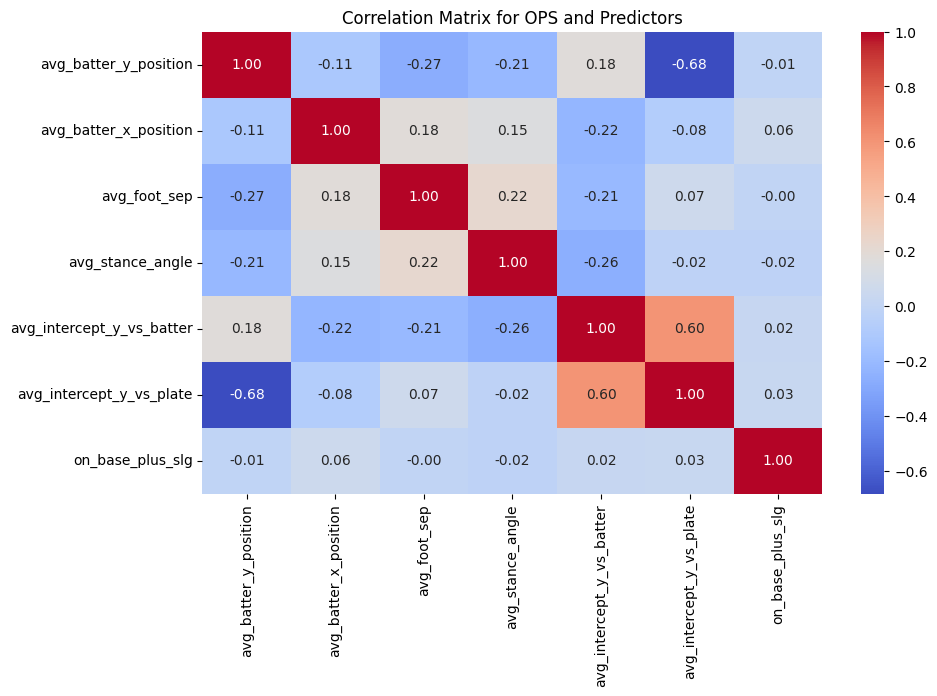

In [139]:
# Correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(ops_data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for OPS and Predictors')
plt.show()

In [140]:
# Train/test split for full dataset
X_ops = ops_data.drop(columns='on_base_plus_slg')
y_ops = ops_data['on_base_plus_slg']
X_ops_train, X_ops_test, y_ops_train, y_ops_test = train_test_split(X_ops, y_ops, test_size=0.2, random_state=42)

# Train/test split for qualified dataset
X_ops_q = ops_data_qualified.drop(columns='on_base_plus_slg')
y_ops_q = ops_data_qualified['on_base_plus_slg']
X_ops_q_train, X_ops_q_test, y_ops_q_train, y_ops_q_test = train_test_split(X_ops_q, y_ops_q, test_size=0.2, random_state=42)

In [141]:
# Standard Scalar on the Data
scaler_ops = StandardScaler()
scaler_ops_q = StandardScaler()
# Fit on training data
scaler_ops.fit(X_ops_train)
scaler_ops_q.fit(X_ops_q_train)
# Transform the data
X_ops_train_scaled = scaler_ops.transform(X_ops_train)
X_ops_test_scaled = scaler_ops.transform(X_ops_test)
X_ops_q_train_scaled = scaler_ops_q.transform(X_ops_q_train)
X_ops_q_test_scaled = scaler_ops_q.transform(X_ops_q_test)

In [142]:
# OLS Regression
X_ops_train_const = sm.add_constant(X_ops_train)
X_ops_test_const = sm.add_constant(X_ops_test)
ols_ops = sm.OLS(y_ops_train, X_ops_train_const).fit()
print(f"Full Data OLS Test R²: {r2_score(y_ops_test, ols_ops.predict(X_ops_test_const)):.3f}")
print(ols_ops.summary())
# Qualified
X_ops_q_train_const = sm.add_constant(X_ops_q_train)
X_ops_q_test_const = sm.add_constant(X_ops_q_test)
ols_ops_q = sm.OLS(y_ops_q_train, X_ops_q_train_const).fit()
print(f"Qualified OLS Test R²: {r2_score(y_ops_q_test, ols_ops_q.predict(X_ops_q_test_const)):.3f}")

# Random Forest Regressor
rf_ops = RandomForestRegressor(n_estimators=100, random_state=42)
rf_ops.fit(X_ops_train, y_ops_train)
y_pred_rf_ops = rf_ops.predict(X_ops_test)
print(f"Full Data Random Forest - MAE: {mean_absolute_error(y_ops_test, y_pred_rf_ops):.3f}, "
      f"MSE: {mean_squared_error(y_ops_test, y_pred_rf_ops):.3f}, R²: {r2_score(y_ops_test, y_pred_rf_ops):.3f}")
# Qualified
rf_ops_q = RandomForestRegressor(n_estimators=100, random_state=42)
rf_ops_q.fit(X_ops_q_train, y_ops_q_train)
y_pred_rf_ops_q = rf_ops_q.predict(X_ops_q_test)
print(f"Qualified RF - MAE: {mean_absolute_error(y_ops_q_test, y_pred_rf_ops_q):.3f}, "
      f"MSE: {mean_squared_error(y_ops_q_test, y_pred_rf_ops_q):.3f}, R²: {r2_score(y_ops_q_test, y_pred_rf_ops_q):.3f}")

Full Data OLS Test R²: -0.025
                            OLS Regression Results                            
Dep. Variable:       on_base_plus_slg   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.541
Date:                Mon, 14 Apr 2025   Prob (F-statistic):              0.162
Time:                        12:49:26   Log-Likelihood:                 608.15
No. Observations:                 794   AIC:                            -1202.
Df Residuals:                     787   BIC:                            -1170.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

In [143]:
# Print OLS Summaries
print("OLS Summary for Full Data:")
print(ols_ops.summary())
print("\nOLS Summary for Qualified Data:")
print(ols_ops_q.summary())

OLS Summary for Full Data:
                            OLS Regression Results                            
Dep. Variable:       on_base_plus_slg   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.541
Date:                Mon, 14 Apr 2025   Prob (F-statistic):              0.162
Time:                        12:49:27   Log-Likelihood:                 608.15
No. Observations:                 794   AIC:                            -1202.
Df Residuals:                     787   BIC:                            -1170.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------

In [144]:
# Print feature importances from each RF model
rf_importances_ops = pd.DataFrame(rf_ops.feature_importances_, index=X_ops.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Feature Importances from Random Forest Regressor:")
print(rf_importances_ops)
rf_importances_ops_q = pd.DataFrame(rf_ops_q.feature_importances_, index=X_ops_q.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Feature Importances from Qualified Random Forest Regressor:")
print(rf_importances_ops_q)

Feature Importances from Random Forest Regressor:
                           importance
avg_batter_x_position        0.190955
avg_foot_sep                 0.185845
avg_stance_angle             0.179290
avg_intercept_y_vs_batter    0.162917
avg_batter_y_position        0.141665
avg_intercept_y_vs_plate     0.139328
Feature Importances from Qualified Random Forest Regressor:
                           importance
avg_intercept_y_vs_batter    0.200737
avg_intercept_y_vs_plate     0.176948
avg_batter_x_position        0.175934
avg_foot_sep                 0.162344
avg_stance_angle             0.157553
avg_batter_y_position        0.126485


## Other

In [ ]:
# Define columns of interest
# Stance + Outcomes (OPS, OBS, SLG, BABIP, HR%, wOBA, ISO, AVG, K%)
outcomes_columns = ['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                    'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate', 
                    'on_base_plus_slg', 'on_base_percent', 'slg_percent', 'batting_average_balls_in_play', 'hr_percent',
                    'woba', 'isolated_power', 'batting_avg', 'k_percent']

# Subset the data
outcomes_data = data[outcomes_columns].dropna()
outcomes_data_qualified = data_qualified[outcomes_columns].dropna()

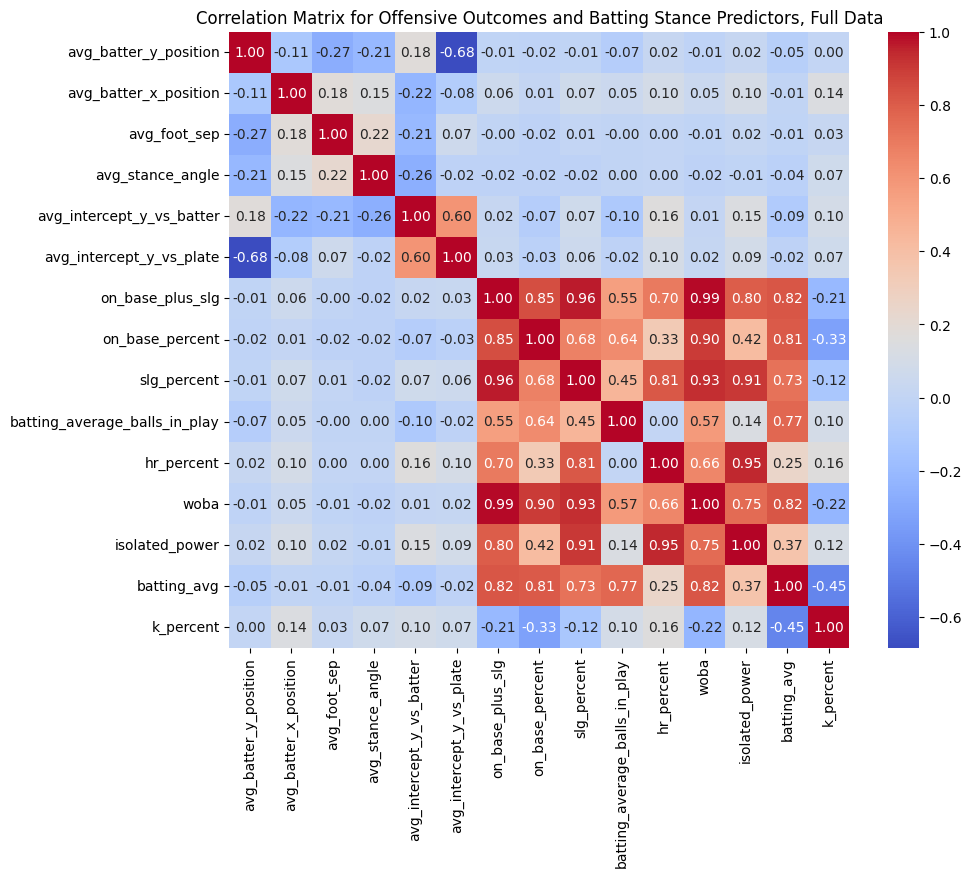

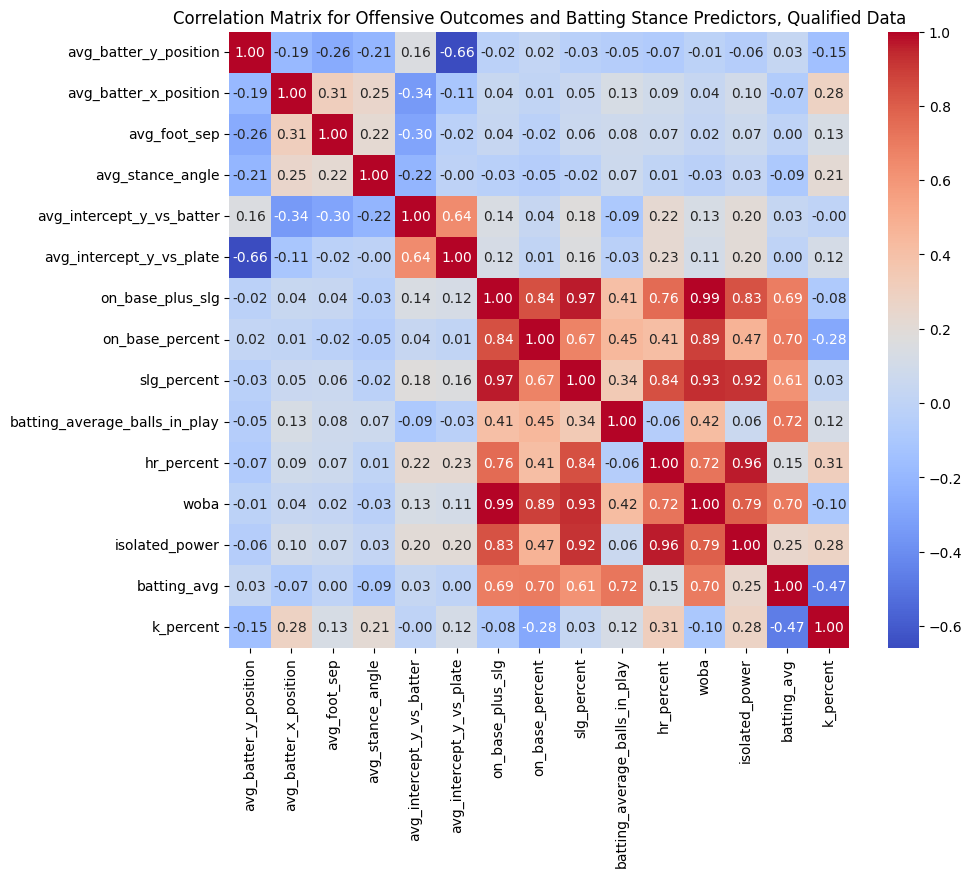

In [146]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(outcomes_data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Offensive Outcomes and Batting Stance Predictors, Full Data')
plt.show()
# Correlation heatmap for qualified data
plt.figure(figsize=(10, 8))
sns.heatmap(outcomes_data_qualified.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Offensive Outcomes and Batting Stance Predictors, Qualified Data')
plt.show()

In [147]:
# Get R^2 for each target variable using Random Forest Regressor
X = outcomes_data[['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                   'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']]
all_targets = ['on_base_plus_slg', 'on_base_percent', 'slg_percent', 'batting_average_balls_in_play', 
               'hr_percent', 'woba', 'isolated_power', 'batting_avg', 'k_percent']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, outcomes_data[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable:")
for target, score in scores:
    print(f"{target}: {score:.3f}")


R^2 Scores for Random Forest Regressor on Each Target Variable:
k_percent: -0.033
batting_average_balls_in_play: -0.119
hr_percent: -0.152
isolated_power: -0.160
on_base_percent: -0.173
batting_avg: -0.253
woba: -0.279
slg_percent: -0.297
on_base_plus_slg: -0.301


# Stance on Swing Statistics 
(Avg Swing Speed, Fast Swing Rate, Blasts/Swing, Squared Up/Swing, Avg Swing Length, Exit Velocity, Launch Angle, Sweet Spot%, Barrel Batted Rate, Solid Contact%, Zone Swing%, Out of Zone Swing%, Zone Contact%, Whiff%)

In [148]:
# Define columns of interest
# Stance + Swing Stats
ostats_columns = ['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle', 
                  'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate',
                  'avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                  'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                  'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']

# Subset the data
ostats_data = data[ostats_columns].dropna()
ostats_data_qualified = data_qualified[ostats_columns].dropna()

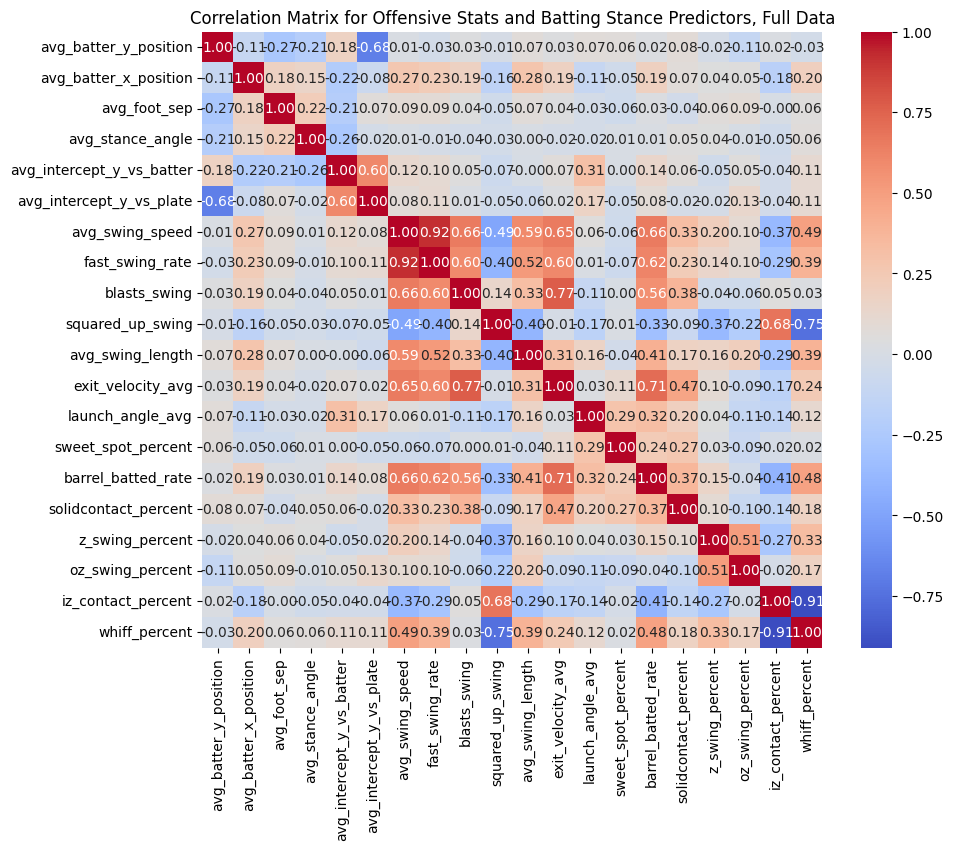

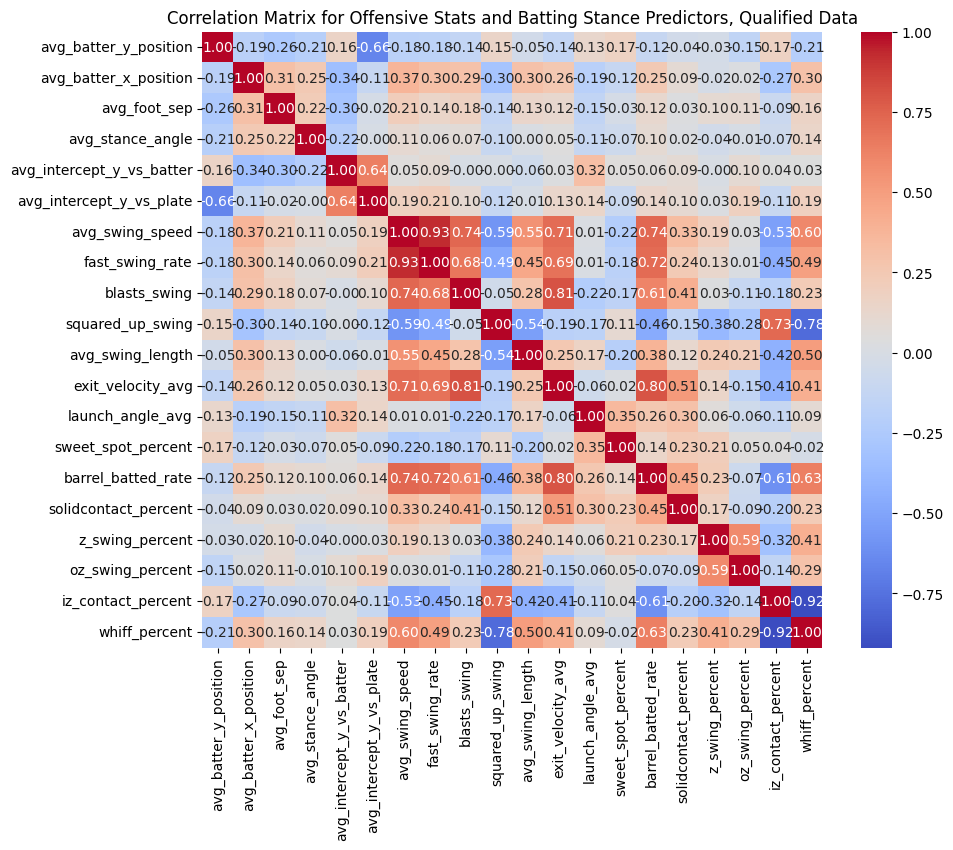

In [149]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(ostats_data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Offensive Stats and Batting Stance Predictors, Full Data')
plt.show()
# Correlation heatmap for qualified data
plt.figure(figsize=(10, 8))
sns.heatmap(ostats_data_qualified.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Offensive Stats and Batting Stance Predictors, Qualified Data')
plt.show()

In [150]:
# Get R^2 for each target variable using Random Forest Regressor
X = ostats_data[['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                 'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']]
all_targets = ['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
               'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
               'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, ostats_data[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable:")
for target, score in scores:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable:
whiff_percent: 0.014
avg_swing_speed: 0.010
launch_angle_avg: 0.007
avg_swing_length: -0.001
squared_up_swing: -0.010
iz_contact_percent: -0.030
z_swing_percent: -0.037
oz_swing_percent: -0.053
sweet_spot_percent: -0.069
barrel_batted_rate: -0.075
exit_velocity_avg: -0.091
blasts_swing: -0.096
fast_swing_rate: -0.102
solidcontact_percent: -0.142


In [365]:
# Repeat for qualified data
X = ostats_data_qualified[['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                            'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']]
all_targets = ['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
               'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
               'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, ostats_data_qualified[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):")
for target, score in scores:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):
avg_swing_speed: 0.108
squared_up_swing: 0.073
fast_swing_rate: 0.040
avg_swing_length: 0.028
whiff_percent: 0.018
sweet_spot_percent: 0.011
iz_contact_percent: -0.008
blasts_swing: -0.012
launch_angle_avg: -0.041
barrel_batted_rate: -0.041
solidcontact_percent: -0.063
exit_velocity_avg: -0.097
oz_swing_percent: -0.121
z_swing_percent: -0.149


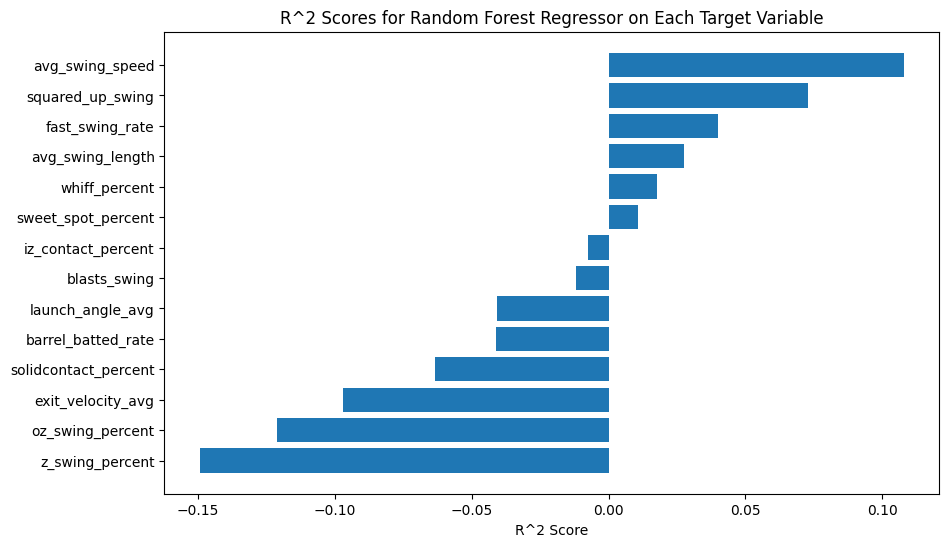

In [390]:
# Plot R^2 scores
plt.figure(figsize=(10, 6))
scores.sort(key=lambda x: x[1], reverse=False)
plt.barh([x[0] for x in scores], [x[1] for x in scores])
plt.xlabel('R^2 Score')
plt.title('R^2 Scores for Random Forest Regressor on Each Target Variable')
plt.show()

Mean R^2 Score for avg_swing_speed: 0.195
Mean Feature Importances for avg_swing_speed:
                           importance
avg_batter_x_position        0.269863
avg_foot_sep                 0.166845
avg_batter_y_position        0.154706
avg_intercept_y_vs_plate     0.146482
avg_intercept_y_vs_batter    0.134639
avg_stance_angle             0.127464


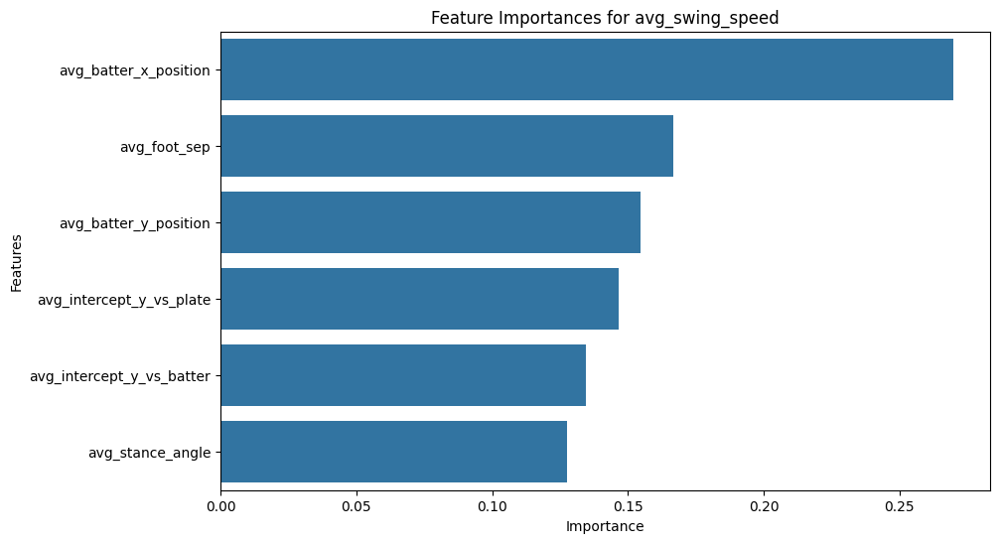

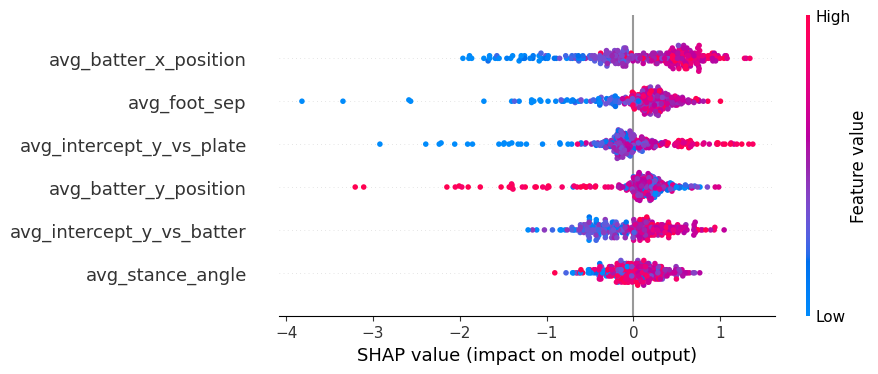

In [369]:
# For avg_swing_speed, get R^2 and feature importances from 5-fold cross-validation Random Forest Regressor
X = ostats_data_qualified[['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                           'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']]
y = ostats_data_qualified['avg_swing_speed']
# Initialize Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
# Perform cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)
r2_scores = []
feature_importances = []
for train_index, test_index in cv.split(X):
    X_train_cv, X_test_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_cv, y_test_cv = y.iloc[train_index], y.iloc[test_index]
    
    rf.fit(X_train_cv, y_train_cv)
    y_pred_cv = rf.predict(X_test_cv)
    
    r2_scores.append(r2_score(y_test_cv, y_pred_cv))
    feature_importances.append(rf.feature_importances_)
# Calculate mean R^2 score
mean_r2_score = np.mean(r2_scores)
print(f"Mean R^2 Score for avg_swing_speed: {mean_r2_score:.3f}")
# Calculate mean feature importances
mean_feature_importances = np.mean(feature_importances, axis=0)
# Create DataFrame for feature importances
feature_importances_df = pd.DataFrame(mean_feature_importances, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Mean Feature Importances for avg_swing_speed:")
print(feature_importances_df)
# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances_df['importance'], y=feature_importances_df.index)
plt.title('Feature Importances for avg_swing_speed')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()
# Plot SHAP Beeswarm plot
explainer = shap.Explainer(rf)
shap_values = explainer(X)
shap.plots.beeswarm(shap_values, max_display=10)

R2: 0.214
Feature Importances for avg_swing_speed using Ridge Regression:
                           importance
avg_intercept_y_vs_plate     1.153661
avg_batter_y_position        1.072875
avg_batter_x_position        0.434713
avg_foot_sep                 0.059523
avg_stance_angle             0.001882
avg_intercept_y_vs_batter   -0.969686


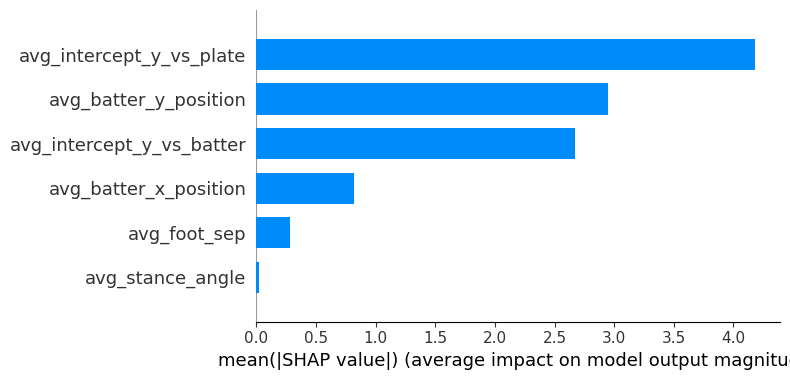

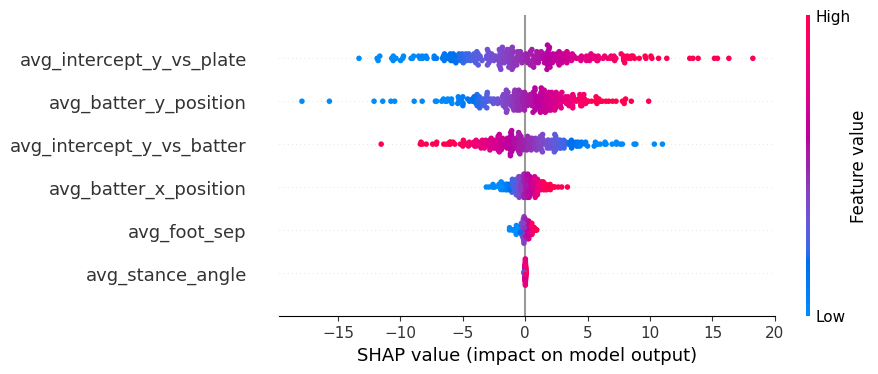

In [363]:
# For avg_swing_speed, get feature importances using Ridge Regression
X = ostats_data_qualified[['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                           'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']]
y = ostats_data_qualified['avg_swing_speed']

# Fit Ridge Regression model
ridge_model = Ridge(alpha=1.0, random_state=42)
ridge_model.fit(X, y)

# Print R^2
y_pred_ridge = ridge_model.predict(X)
print(f"R2: {r2_score(y, y_pred_ridge):.3f}")

# Get coefficients as feature importances
ridge_importances = pd.DataFrame(ridge_model.coef_, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Feature Importances for avg_swing_speed using Ridge Regression:")
print(ridge_importances)

# SHAP values for Ridge Regression
explainer = shap.Explainer(ridge_model, X)
shap_values = explainer(X)
shap.summary_plot(shap_values, X, plot_type="bar")
shap.plots.beeswarm(shap_values)

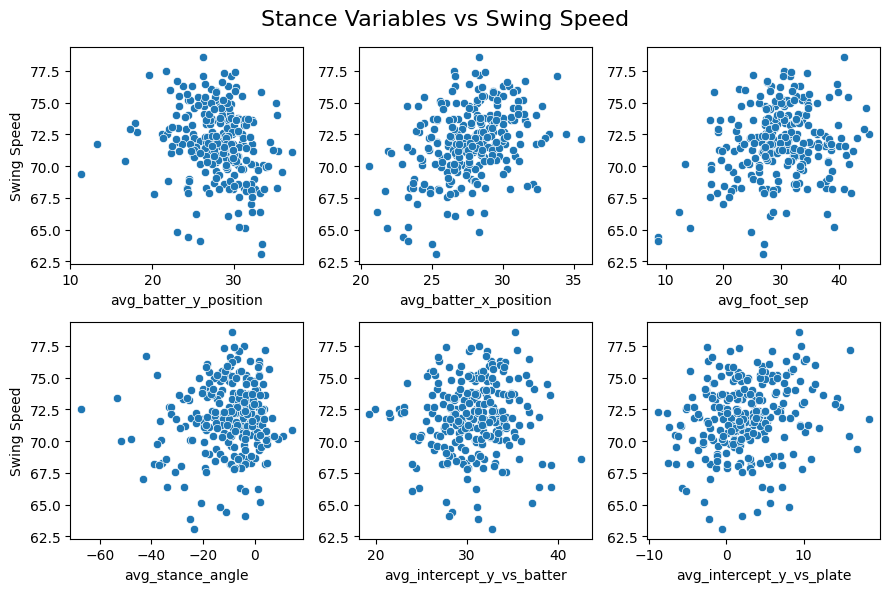

In [389]:
# Make scatterplots of hbp_percent and b_hit_by_pitch vs hbp_columns
stance_factors = ['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle', 'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']
fig, axs = plt.subplots(2, 3, figsize=(9, 6))
axs = axs.flatten()
# Loop through each column and plot
for i, col in enumerate(ostats_data_qualified.columns[0:6]):
    # Plot hbp_percent vs column
    sns.scatterplot(data=ostats_data_qualified, x=col, y='avg_swing_speed', ax=axs[i])
    axs[i].set_xlabel(col)
    axs[i].set_ylabel('')
axs[0].set_ylabel('Swing Speed')
axs[3].set_ylabel('Swing Speed')
fig.suptitle('Stance Variables vs Swing Speed', fontsize=16)
plt.tight_layout()
plt.show()

# Stance on Pitch-Type Outcomes

In [ ]:
# Define columns of interest
# Stance + Pitch-Type Outcome Percent Change vs All Pitches
pitch_type_columns = ['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                    'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate', 
                    'whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH',
                    'woba_change_CH', 'whiff_percent_change_CU', 'k_percent_change_CU',
                    'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC',
                    'k_percent_change_FC', 'slg_change_FC', 'woba_change_FC',
                    'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF',
                    'woba_change_FF', 'whiff_percent_change_SI', 'k_percent_change_SI',
                    'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL',
                    'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL']

# Subset the data
pitch_type_data = data[pitch_type_columns].dropna()
pitch_type_data_qualified = data_qualified[pitch_type_columns].dropna()

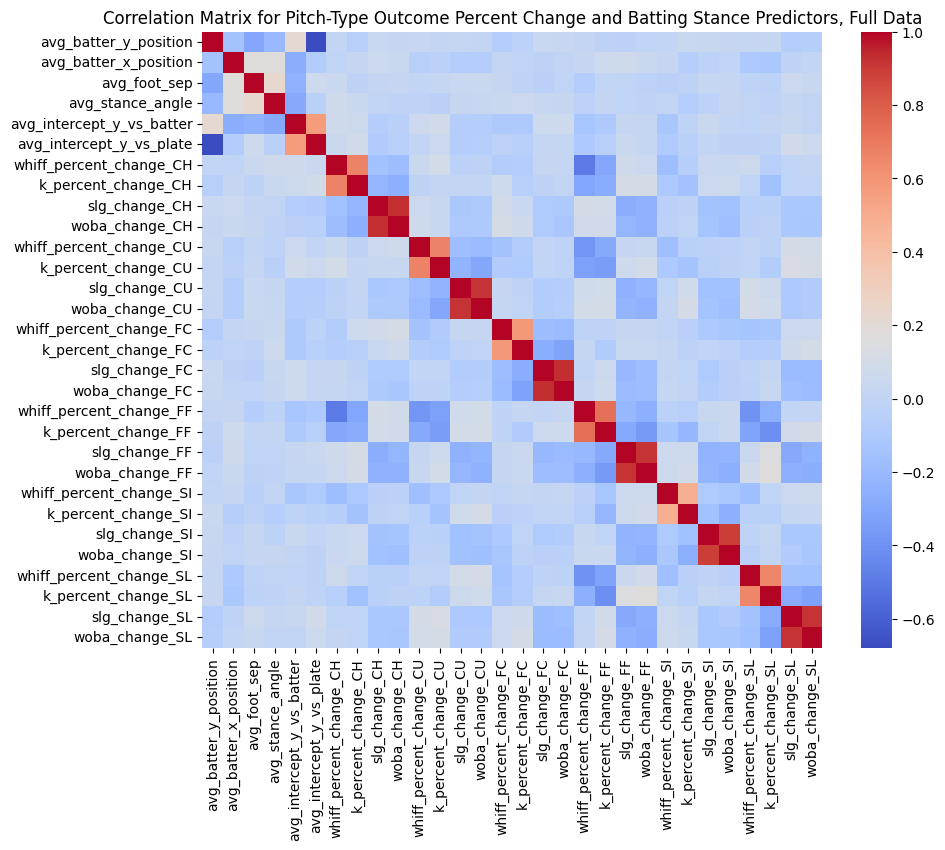

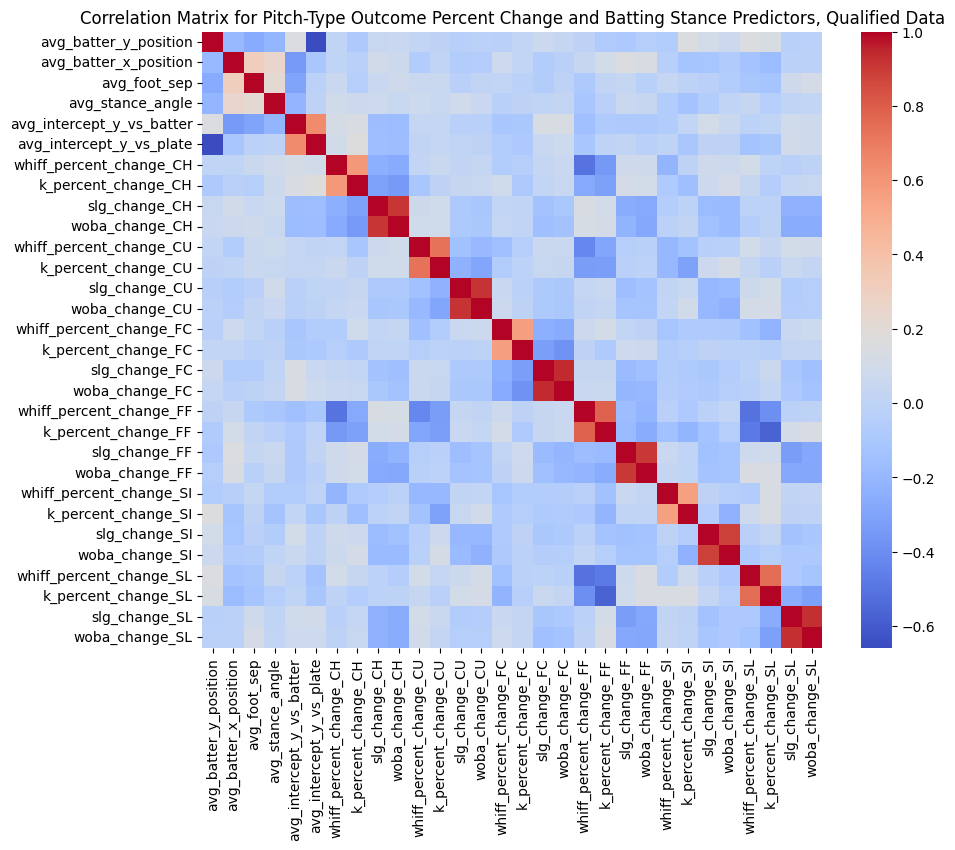

In [158]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pitch_type_data.corr(), annot=False, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Pitch-Type Outcome Percent Change and Batting Stance Predictors, Full Data')
plt.show()
# Correlation heatmap for qualified data
plt.figure(figsize=(10, 8))
sns.heatmap(pitch_type_data_qualified.corr(), annot=False, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Pitch-Type Outcome Percent Change and Batting Stance Predictors, Qualified Data')
plt.show()

In [159]:
# Get R^2 for each target variable using Random Forest Regressor
X = pitch_type_data[['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                      'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']]
all_targets = ['whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH',
               'woba_change_CH', 'whiff_percent_change_CU', 'k_percent_change_CU',
               'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC',
               'k_percent_change_FC', 'slg_change_FC', 'woba_change_FC',
               'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF',
               'woba_change_FF', 'whiff_percent_change_SI', 'k_percent_change_SI',
               'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL',
               'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, pitch_type_data[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable:")
for target, score in scores:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable:
whiff_percent_change_SL: -0.012
whiff_percent_change_CU: -0.040
whiff_percent_change_FF: -0.053
k_percent_change_CU: -0.082
k_percent_change_CH: -0.088
whiff_percent_change_CH: -0.095
k_percent_change_SI: -0.100
slg_change_CH: -0.104
k_percent_change_SL: -0.110
whiff_percent_change_FC: -0.111
whiff_percent_change_SI: -0.116
woba_change_SL: -0.117
woba_change_CU: -0.117
woba_change_SI: -0.118
slg_change_SI: -0.118
slg_change_CU: -0.121
woba_change_CH: -0.124
k_percent_change_FF: -0.125
slg_change_SL: -0.153
k_percent_change_FC: -0.154
woba_change_FC: -0.161
slg_change_FC: -0.175
slg_change_FF: -0.192
woba_change_FF: -0.251


In [160]:
# Repeat for qualified data
X = pitch_type_data_qualified[['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                                 'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']]
all_targets = ['whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH',
               'woba_change_CH', 'whiff_percent_change_CU', 'k_percent_change_CU',
               'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC',
               'k_percent_change_FC', 'slg_change_FC', 'woba_change_FC',
               'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF',
               'woba_change_FF', 'whiff_percent_change_SI', 'k_percent_change_SI',
               'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL',
               'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, pitch_type_data_qualified[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):")
for target, score in scores:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):
whiff_percent_change_SL: -0.014
whiff_percent_change_FF: -0.040
k_percent_change_SL: -0.059
whiff_percent_change_CU: -0.068
slg_change_FF: -0.082
woba_change_CH: -0.090
k_percent_change_CH: -0.098
whiff_percent_change_CH: -0.109
slg_change_CU: -0.121
k_percent_change_SI: -0.122
woba_change_SI: -0.129
woba_change_FC: -0.131
woba_change_FF: -0.139
slg_change_CH: -0.145
woba_change_CU: -0.153
slg_change_SI: -0.156
whiff_percent_change_SI: -0.165
k_percent_change_CU: -0.166
slg_change_FC: -0.166
whiff_percent_change_FC: -0.194
k_percent_change_FF: -0.208
k_percent_change_FC: -0.231
slg_change_SL: -0.236
woba_change_SL: -0.255


# Swing on Pitch-Type Outcomes

In [ ]:
# Define columns of interest
# Swing + Pitch-Type Outcome Percent Change vs All Pitches
swing_pitch_type_columns = ['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                            'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                            'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent',
                            'whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH',
                            'woba_change_CH', 'whiff_percent_change_CU', 'k_percent_change_CU',
                            'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC',
                            'k_percent_change_FC', 'slg_change_FC', 'woba_change_FC',
                            'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF',
                            'woba_change_FF', 'whiff_percent_change_SI', 'k_percent_change_SI',
                            'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL',
                            'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL']

# Subset the data
swing_pitch_type_data = data[swing_pitch_type_columns].dropna()
swing_pitch_type_data_qualified = data_qualified[swing_pitch_type_columns].dropna()

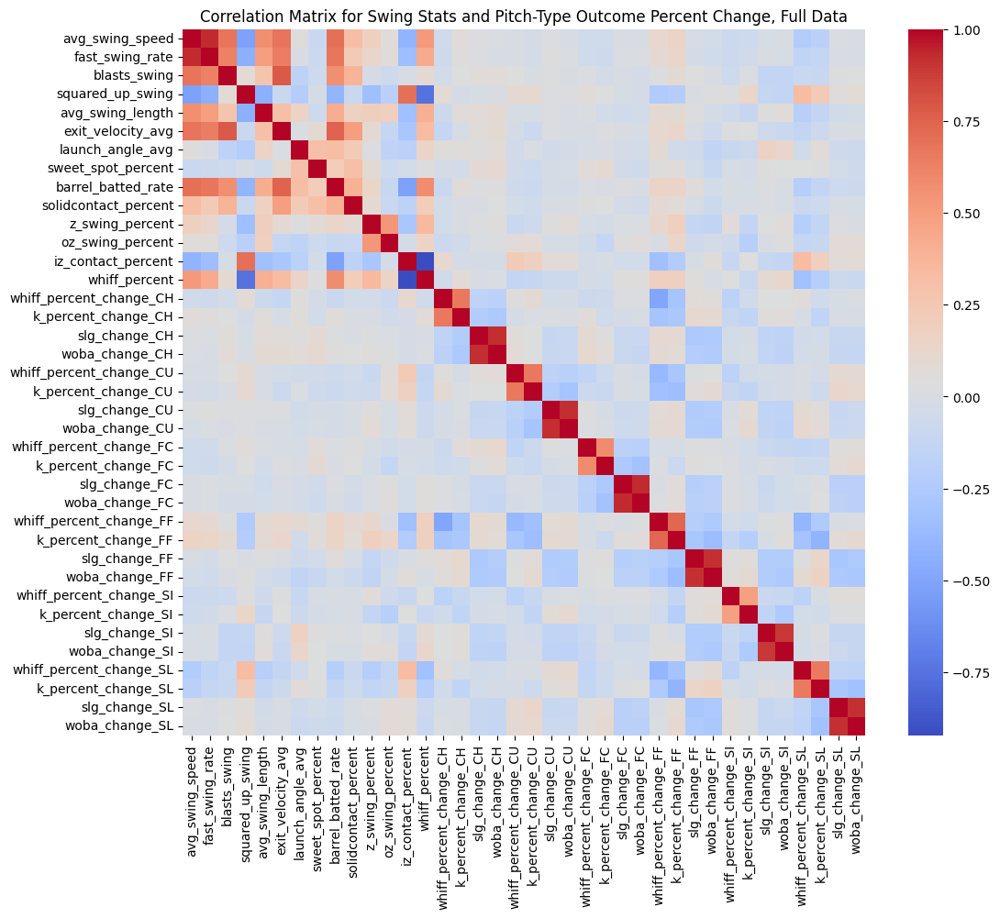

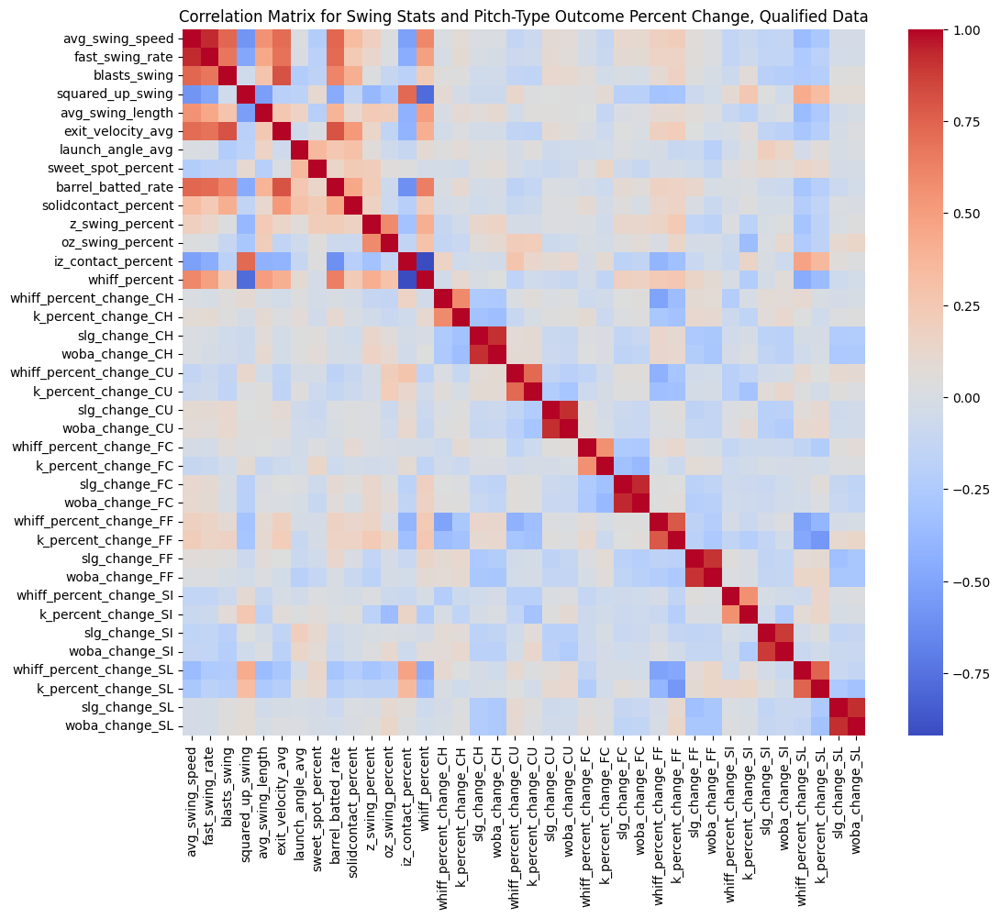

In [ ]:
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(swing_pitch_type_data.corr(), annot=False, cmap='coolwarm', fmt='.1f')
plt.title('Correlation Matrix for Swing Stats and Pitch-Type Outcome Percent Change, Full Data')
plt.show()
# Correlation heatmap for qualified data
plt.figure(figsize=(12, 10))
sns.heatmap(swing_pitch_type_data_qualified.corr(), annot=False, cmap='coolwarm', fmt='.1f')
plt.title('Correlation Matrix for Swing Stats and Pitch-Type Outcome Percent Change, Qualified Data')
plt.show()

In [ ]:
# Get R^2 for each target variable using Random Forest Regressor
X = swing_pitch_type_data[['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                            'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                            'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']]
all_targets = ['whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH',
               'woba_change_CH', 'whiff_percent_change_CU', 'k_percent_change_CU',
               'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC',
               'k_percent_change_FC', 'slg_change_FC', 'woba_change_FC',
               'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF',
               'woba_change_FF', 'whiff_percent_change_SI', 'k_percent_change_SI',
               'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL',
               'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, swing_pitch_type_data[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable:")
for target, score in scores:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable:
whiff_percent_change_SL: 0.172
whiff_percent_change_FF: 0.088
k_percent_change_SL: 0.027
k_percent_change_FF: 0.006
k_percent_change_SI: -0.029
k_percent_change_CU: -0.030
woba_change_SI: -0.030
woba_change_CH: -0.033
whiff_percent_change_CU: -0.033
slg_change_CH: -0.044
k_percent_change_CH: -0.058
whiff_percent_change_SI: -0.059
woba_change_SL: -0.061
whiff_percent_change_CH: -0.071
woba_change_CU: -0.071
slg_change_FF: -0.073
slg_change_SI: -0.076
k_percent_change_FC: -0.079
slg_change_CU: -0.086
slg_change_SL: -0.086
whiff_percent_change_FC: -0.097
woba_change_FF: -0.103
woba_change_FC: -0.135
slg_change_FC: -0.159


In [ ]:
# Repeat for qualified data
X = swing_pitch_type_data_qualified[['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                                       'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                                       'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']]
all_targets = ['whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH',
               'woba_change_CH', 'whiff_percent_change_CU', 'k_percent_change_CU',
               'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC',
               'k_percent_change_FC', 'slg_change_FC', 'woba_change_FC',
               'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF',
               'woba_change_FF', 'whiff_percent_change_SI', 'k_percent_change_SI',
               'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL',
               'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, swing_pitch_type_data_qualified[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):")
for target, score in scores:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):
whiff_percent_change_SL: 0.292
whiff_percent_change_FF: 0.132
k_percent_change_SL: 0.082
k_percent_change_FF: 0.016
whiff_percent_change_CU: 0.008
k_percent_change_CH: -0.004
k_percent_change_SI: -0.017
whiff_percent_change_CH: -0.039
whiff_percent_change_SI: -0.048
woba_change_SL: -0.049
slg_change_CU: -0.054
slg_change_FF: -0.064
woba_change_CH: -0.072
woba_change_CU: -0.074
woba_change_SI: -0.088
slg_change_FC: -0.096
k_percent_change_CU: -0.099
slg_change_CH: -0.109
slg_change_SL: -0.128
slg_change_SI: -0.128
woba_change_FC: -0.133
woba_change_FF: -0.150
whiff_percent_change_FC: -0.210
k_percent_change_FC: -0.217


In [ ]:
# Run again for whiff_percent_change_SL and FF, get feature importances
X = swing_pitch_type_data_qualified[['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                            'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                            'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']]
# Fit the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, swing_pitch_type_data_qualified['whiff_percent_change_SL'])
# Get feature importances
importances = rf.feature_importances_
# Create a DataFrame for feature importances
feature_importances = pd.DataFrame(importances, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
# Print feature importances
print("Feature Importances for whiff_percent_change_SL (Qualified Data):")
print(feature_importances)
# Fit the model for whiff_percent_change_FF
rf_ff = RandomForestRegressor(n_estimators=100, random_state=42)
rf_ff.fit(X, swing_pitch_type_data_qualified['whiff_percent_change_FF'])
# Get feature importances
importances_ff = rf_ff.feature_importances_
# Create a DataFrame for feature importances
feature_importances_ff = pd.DataFrame(importances_ff, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
# Print feature importances
print("Feature Importances for whiff_percent_change_FF (Qualified Data):")
print(feature_importances_ff)

Feature Importances for whiff_percent_change_SL (Qualified Data):
                      importance
whiff_percent           0.243378
iz_contact_percent      0.198039
oz_swing_percent        0.066092
z_swing_percent         0.059616
sweet_spot_percent      0.048043
exit_velocity_avg       0.047707
launch_angle_avg        0.046869
fast_swing_rate         0.046367
barrel_batted_rate      0.046087
avg_swing_length        0.042007
avg_swing_speed         0.039755
squared_up_swing        0.039239
blasts_swing            0.039164
solidcontact_percent    0.037635
Feature Importances for whiff_percent_change_FF (Qualified Data):
                      importance
iz_contact_percent      0.274206
fast_swing_rate         0.078370
whiff_percent           0.064952
solidcontact_percent    0.064737
sweet_spot_percent      0.060892
oz_swing_percent        0.059673
squared_up_swing        0.059035
z_swing_percent         0.056066
avg_swing_speed         0.056046
avg_swing_length        0.054902
launch_ang

# Swing on Offensive Outcomes

## Full Outcome Set

In [163]:
# Define columns of interest
# Swing + Outcomes
swing_outcomes_columns = ['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                          'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                          'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent',
                          'on_base_plus_slg', 'on_base_percent', 'slg_percent', 'batting_average_balls_in_play', 'hr_percent',
                          'woba', 'isolated_power', 'batting_avg', 'k_percent']

# Subset the data
swing_outcomes_data = data[swing_outcomes_columns].dropna()
swing_outcomes_data_qualified = data_qualified[swing_outcomes_columns].dropna()

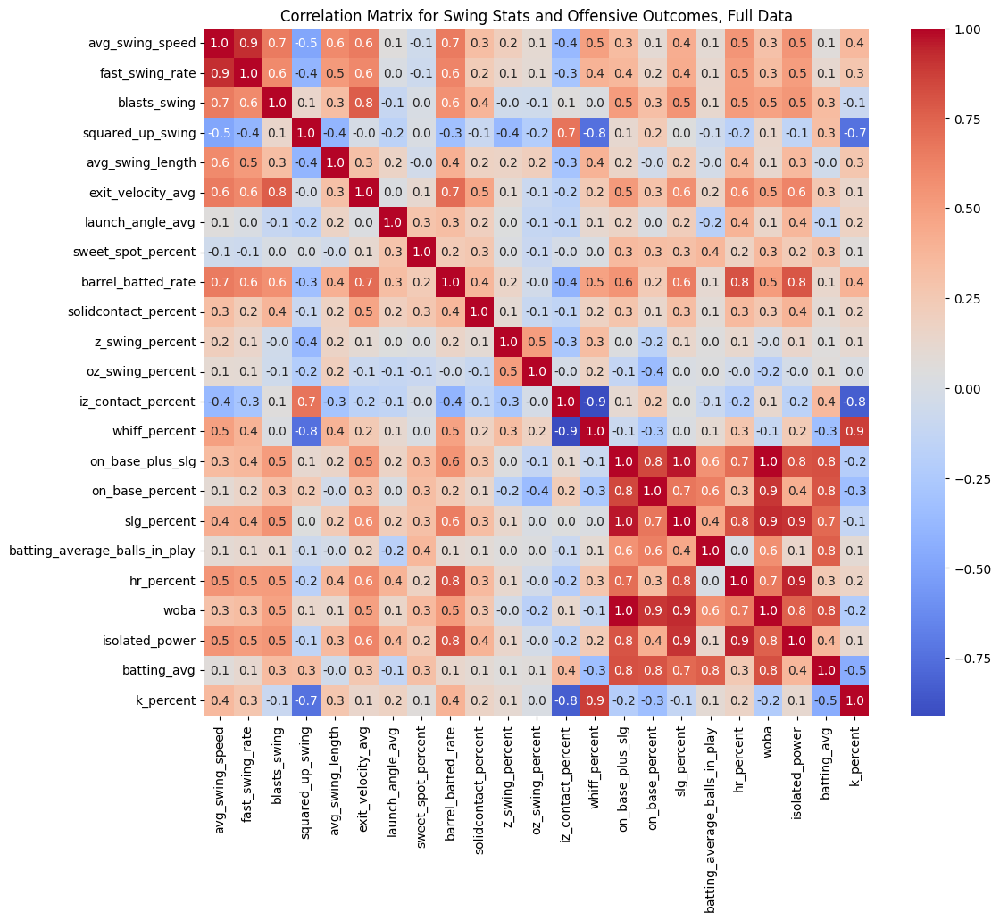

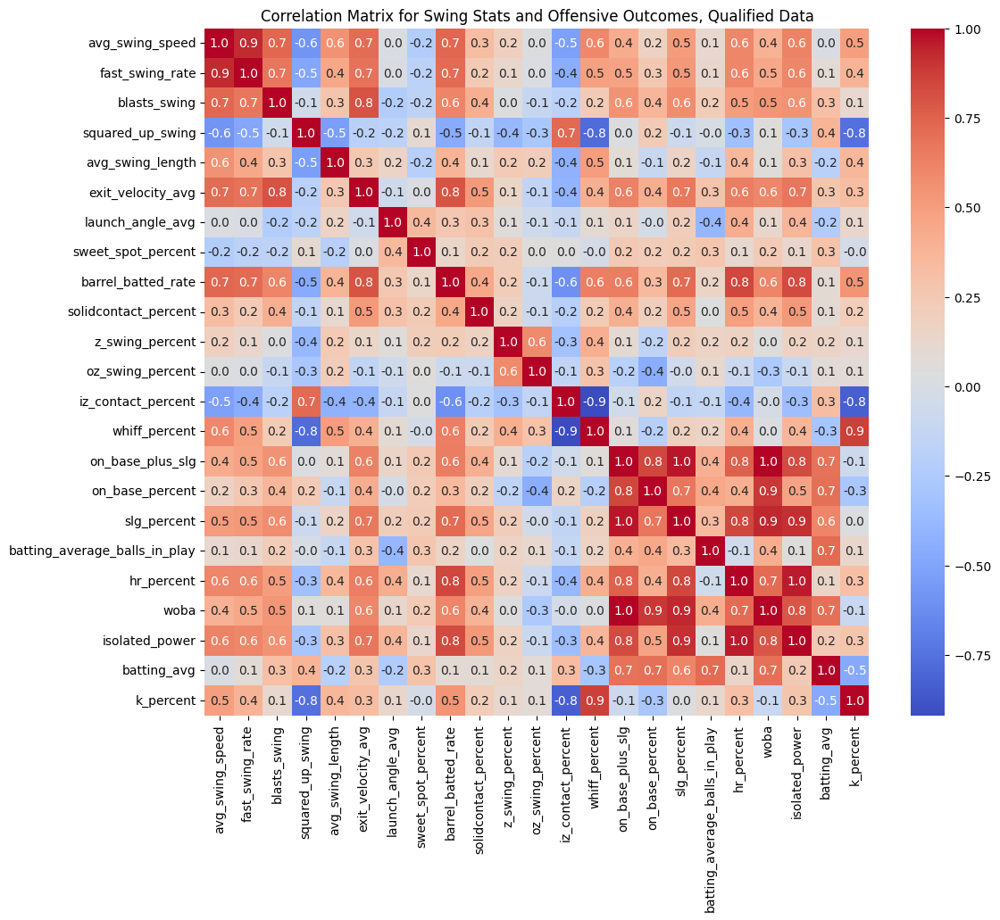

In [165]:
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(swing_outcomes_data.corr(), annot=True, cmap='coolwarm', fmt='.1f')
plt.title('Correlation Matrix for Swing Stats and Offensive Outcomes, Full Data')
plt.show()
# Correlation heatmap for qualified data
plt.figure(figsize=(12, 10))
sns.heatmap(swing_outcomes_data_qualified.corr(), annot=True, cmap='coolwarm', fmt='.1f')
plt.title('Correlation Matrix for Swing Stats and Offensive Outcomes, Qualified Data')
plt.show()

In [166]:
# Get R^2 for each target variable using Random Forest Regressor
X = swing_outcomes_data[['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                          'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                          'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']]
all_targets = ['on_base_plus_slg', 'on_base_percent', 'slg_percent', 'batting_average_balls_in_play',
               'hr_percent', 'woba', 'isolated_power', 'batting_avg', 'k_percent']
scores = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, swing_outcomes_data[target], cv=5, scoring='r2').mean()
    scores.append((target, score))
# Sort by R^2
scores.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable:")
for target, score in scores:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable:
k_percent: 0.809
isolated_power: 0.641
hr_percent: 0.640
slg_percent: 0.481
on_base_plus_slg: 0.400
woba: 0.371
batting_avg: 0.282
on_base_percent: 0.279
batting_average_balls_in_play: 0.179


In [332]:
# Repeat for qualified data
X = swing_outcomes_data_qualified[['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                                    'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                                    'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']]
all_targets = ['on_base_plus_slg', 'on_base_percent', 'slg_percent', 'batting_average_balls_in_play',
               'hr_percent', 'woba', 'isolated_power', 'batting_avg', 'k_percent']
scores_quick_rf_q = []
for target in all_targets:
    model = RandomForestRegressor()
    score = cross_val_score(model, X, swing_outcomes_data_qualified[target], cv=5, scoring='r2').mean()
    scores_quick_rf_q.append((target, score))
# Sort by R^2
scores_quick_rf_q.sort(key=lambda x: x[1], reverse=True)
# Print scores
print("R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):")
for target, score in scores_quick_rf_q:
    print(f"{target}: {score:.3f}")

R^2 Scores for Random Forest Regressor on Each Target Variable (Qualified Data):
k_percent: 0.786
hr_percent: 0.683
isolated_power: 0.654
slg_percent: 0.528
on_base_plus_slg: 0.446
woba: 0.410
batting_avg: 0.345
on_base_percent: 0.341
batting_average_balls_in_play: 0.191


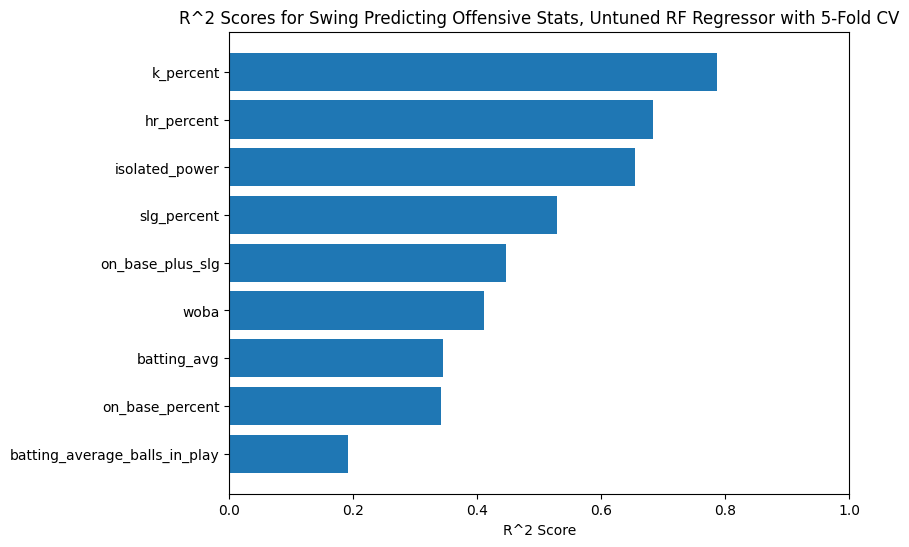

In [333]:
# Plot the R^2 scores from Qualified Data Results
plt.figure(figsize=(8, 6))
plt.barh([target for target, _ in scores_quick_rf_q], [score for _, score in scores_quick_rf_q])
plt.xlabel('R^2 Score')
plt.xlim(0, 1)
plt.title('R^2 Scores for Swing Predicting Offensive Stats, Untuned RF Regressor with 5-Fold CV')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score on top
plt.show()

## Swing on Strike Out%

In [424]:
# Set X and Y for Swing Stats predicting k_percent
swing_columns = ['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                 'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                 'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']
X = data[swing_columns].dropna()
y = data['k_percent'].dropna()
X_q = data_qualified[swing_columns].dropna()
y_q = data_qualified['k_percent'].dropna()

In [425]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_q_train, X_q_test, y_q_train, y_q_test = train_test_split(X_q, y_q, test_size=0.2, random_state=42)

### Ridge/Lasso Regression

In [426]:
# StandardScaler on the Data
scaler = StandardScaler()
scaler_q = StandardScaler()
# Fit on training data
scaler.fit(X_train)
scaler_q.fit(X_q_train)
# Transform the data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_q_train_scaled = scaler_q.transform(X_q_train)
X_q_test_scaled = scaler_q.transform(X_q_test)
# Convert back to DataFrames
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns, index=X_test.index)
X_q_train_scaled = pd.DataFrame(X_q_train_scaled, columns=X_q.columns, index=X_q_train.index)
X_q_test_scaled = pd.DataFrame(X_q_test_scaled, columns=X_q.columns, index=X_q_test.index)

In [427]:
# Ridge Regression for Swing Stats predicting k_percent
ridge = RidgeCV(alphas=np.logspace(-4, 4, 100), store_cv_results=True)
ridge.fit(X_train_scaled, y_train)
y_pred_ridge = ridge.predict(X_test_scaled)
print(f"Ridge Regression - MAE: {mean_absolute_error(y_test, y_pred_ridge):.3f}, "
      f"MSE: {mean_squared_error(y_test, y_pred_ridge):.3f}, R2: {r2_score(y_test, y_pred_ridge):.3f}")
print(f"Best alpha: {ridge.alpha_:.5f}")

ridge_q = RidgeCV(alphas=np.logspace(-4, 4, 100), store_cv_results=True)
ridge_q.fit(X_q_train_scaled, y_q_train)
y_q_pred_ridge = ridge_q.predict(X_q_test_scaled)
print(f"Qualified Ridge Regression - MAE: {mean_absolute_error(y_q_test, y_q_pred_ridge):.3f}, "
      f"MSE: {mean_squared_error(y_q_test, y_q_pred_ridge):.3f}, R2: {r2_score(y_q_test, y_q_pred_ridge):.3f}")
print(f"Best alpha: {ridge_q.alpha_:.5f}")

Ridge Regression - MAE: 2.029, MSE: 6.781, R2: 0.842
Best alpha: 3.35160
Qualified Ridge Regression - MAE: 1.421, MSE: 3.409, R2: 0.867
Best alpha: 1.32194


In [428]:
# Print feature importances
ridge_coeffs = pd.Series(ridge.coef_, index=X_train.columns).sort_values(key=abs, ascending=False)
print("Ridge feature importances (coefficients) Full Data:")
print(ridge_coeffs)

Ridge feature importances (coefficients) Full Data:
whiff_percent           4.684767
squared_up_swing       -1.919015
z_swing_percent        -1.647310
blasts_swing           -0.860895
exit_velocity_avg       0.829382
iz_contact_percent     -0.444645
fast_swing_rate        -0.418522
avg_swing_length       -0.346647
solidcontact_percent    0.230233
launch_angle_avg        0.180705
oz_swing_percent       -0.178081
avg_swing_speed        -0.164797
sweet_spot_percent      0.146114
barrel_batted_rate      0.082641
dtype: float64


In [429]:
ridge_q_coeffs = pd.Series(ridge_q.coef_, index=X_q_train.columns).sort_values(key=abs, ascending=False)
print("Ridge feature importances (coefficients) Qualified Data:")
print(ridge_q_coeffs)

Ridge feature importances (coefficients) Qualified Data:
whiff_percent           4.314050
squared_up_swing       -1.662794
z_swing_percent        -1.454115
exit_velocity_avg       0.810102
fast_swing_rate        -0.710108
avg_swing_length       -0.389666
sweet_spot_percent      0.316330
blasts_swing           -0.311382
barrel_batted_rate     -0.280012
avg_swing_speed         0.248768
oz_swing_percent       -0.244324
launch_angle_avg        0.089869
solidcontact_percent   -0.031508
iz_contact_percent      0.017209
dtype: float64


In [430]:
# Lasso Regression for Swing Stats predicting k_percent
lasso = LassoCV(alphas=np.logspace(-4, 1, 100), cv=5)
lasso.fit(X_train_scaled, y_train)
y_pred_lasso = lasso.predict(X_test_scaled)
print(f"Lasso Regression - MAE: {mean_absolute_error(y_test, y_pred_lasso):.3f}, "
      f"MSE: {mean_squared_error(y_test, y_pred_lasso):.3f}, R2: {r2_score(y_test, y_pred_lasso):.3f}")
print(f"Best alpha: {lasso.alpha_:.5f}")

lasso_q = LassoCV(alphas=np.logspace(-4, 1, 100), cv=5)
lasso_q.fit(X_q_train_scaled, y_q_train)
y_q_pred_lasso = lasso_q.predict(X_q_test_scaled)
print(f"Qualified Lasso Regression - MAE: {mean_absolute_error(y_q_test, y_q_pred_lasso):.3f}, "
      f"MSE: {mean_squared_error(y_q_test, y_q_pred_lasso):.3f}, R2: {r2_score(y_q_test, y_q_pred_lasso):.3f}")
print(f"Best alpha: {lasso_q.alpha_:.5f}")

Lasso Regression - MAE: 2.018, MSE: 6.744, R2: 0.843
Best alpha: 0.01874
Qualified Lasso Regression - MAE: 1.436, MSE: 3.491, R2: 0.864
Best alpha: 0.02656


In [431]:
# Print feature importances
lasso_features = pd.Series(lasso.coef_, index=X_train.columns)
important_features = lasso_features[lasso_features != 0].sort_values(key=abs, ascending=False)
print("Important features selected by Lasso:")
print(important_features)

Important features selected by Lasso:
whiff_percent           4.818975
squared_up_swing       -1.839887
z_swing_percent        -1.622196
blasts_swing           -0.831402
exit_velocity_avg       0.751394
fast_swing_rate        -0.410781
iz_contact_percent     -0.354471
avg_swing_length       -0.337568
solidcontact_percent    0.214549
oz_swing_percent       -0.193504
launch_angle_avg        0.186771
sweet_spot_percent      0.150284
avg_swing_speed        -0.090513
barrel_batted_rate      0.041200
dtype: float64


In [432]:
lasso_q_features = pd.Series(lasso_q.coef_, index=X_q_train.columns)
important_q_features = lasso_q_features[lasso_q_features != 0].sort_values(key=abs, ascending=False)
print("Important features selected by Lasso for Qualified Data:")
print(important_q_features)

Important features selected by Lasso for Qualified Data:
whiff_percent           4.308303
squared_up_swing       -1.590609
z_swing_percent        -1.422638
fast_swing_rate        -0.527837
exit_velocity_avg       0.517454
avg_swing_length       -0.344902
sweet_spot_percent      0.278233
oz_swing_percent       -0.230588
blasts_swing           -0.182343
barrel_batted_rate     -0.033870
launch_angle_avg        0.013818
solidcontact_percent    0.000350
dtype: float64


### RF Regression

In [433]:
# RF Regression with Hyperparameter Tuning
rf_regressor = RandomForestRegressor(random_state=42)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
rf_random = RandomizedSearchCV(estimator=rf_regressor, param_distributions=param_grid,
                               cv=5, random_state=42, n_jobs=-1)
rf_random.fit(X_train, y_train)
y_pred_rf_random = rf_random.predict(X_test)
print(f"Random Forest Regression (Randomized Search) - MAE: {mean_absolute_error(y_test, y_pred_rf_random):.3f}, "
      f"MSE: {mean_squared_error(y_test, y_pred_rf_random):.3f}, R2: {r2_score(y_test, y_pred_rf_random):.3f}")
print(f"Best parameters: {rf_random.best_params_}")
# print feature importances
rf_importances_random = pd.DataFrame(rf_random.best_estimator_.feature_importances_, index=X_train.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Feature importances from Random Forest Regressor (Randomized Search):")
print(rf_importances_random)

Random Forest Regression (Randomized Search) - MAE: 2.178, MSE: 7.595, R2: 0.823
Best parameters: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30}
Feature importances from Random Forest Regressor (Randomized Search):
                      importance
whiff_percent           0.691732
iz_contact_percent      0.110771
squared_up_swing        0.039805
z_swing_percent         0.039654
launch_angle_avg        0.019620
oz_swing_percent        0.017729
solidcontact_percent    0.013303
blasts_swing            0.012994
sweet_spot_percent      0.012622
fast_swing_rate         0.010841
barrel_batted_rate      0.008108
exit_velocity_avg       0.007930
avg_swing_length        0.007871
avg_swing_speed         0.007019


In [434]:
# RF Regression with Hyperparameter Tuning for Qualified Data
rf_regressor_q = RandomForestRegressor(random_state=42)
rf_random_q = RandomizedSearchCV(estimator=rf_regressor_q, param_distributions=param_grid,
                                 cv=5, random_state=42, n_jobs=-1)
rf_random_q.fit(X_q_train, y_q_train)
y_q_pred_rf_random = rf_random_q.predict(X_q_test)
print(f"Qualified Random Forest Regression (Randomized Search) - MAE: {mean_absolute_error(y_q_test, y_q_pred_rf_random):.3f}, "
      f"MSE: {mean_squared_error(y_q_test, y_q_pred_rf_random):.3f}, R2: {r2_score(y_q_test, y_q_pred_rf_random):.3f}")
print(f"Best parameters: {rf_random_q.best_params_}")
# print feature importances
rf_importances_random_q = pd.DataFrame(rf_random_q.best_estimator_.feature_importances_, index=X_q_train.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Feature importances from Random Forest Regressor (Randomized Search) for Qualified Data:")
print(rf_importances_random_q)

Qualified Random Forest Regression (Randomized Search) - MAE: 2.026, MSE: 6.638, R2: 0.741
Best parameters: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30}
Feature importances from Random Forest Regressor (Randomized Search) for Qualified Data:
                      importance
whiff_percent           0.641362
iz_contact_percent      0.183357
z_swing_percent         0.034854
squared_up_swing        0.031570
barrel_batted_rate      0.016776
sweet_spot_percent      0.013861
solidcontact_percent    0.012848
launch_angle_avg        0.012436
blasts_swing            0.011710
oz_swing_percent        0.010313
avg_swing_speed         0.008059
avg_swing_length        0.007850
fast_swing_rate         0.007607
exit_velocity_avg       0.007396


### XGBoost

In [435]:
# XGBoost Regressor with Hyperparameter Tuning
xgb_regressor = XGBRegressor(objective='reg:squarederror', random_state=42)
param_grid_xgb = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 5, 10],
    'min_child_weight': [1, 3, 5]
}
xgb_random = RandomizedSearchCV(estimator=xgb_regressor, param_distributions=param_grid_xgb,
                               cv=5, random_state=42, n_jobs=-1, n_iter=200, scoring='r2')
xgb_random.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)
y_pred_xgb_random = xgb_random.predict(X_test)
print(f"XGBoost Regression (Randomized Search) - MAE: {mean_absolute_error(y_test, y_pred_xgb_random):.3f}, "
      f"MSE: {mean_squared_error(y_test, y_pred_xgb_random):.3f}, R2: {r2_score(y_test, y_pred_xgb_random):.3f}")
print(f"Best parameters: {xgb_random.best_params_}")
# print feature importances
xgb_importances = pd.DataFrame(xgb_random.best_estimator_.feature_importances_, index=X_train.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Feature importances from XGBoost Regressor (Randomized Search):")
print(xgb_importances)

XGBoost Regression (Randomized Search) - MAE: 2.152, MSE: 7.285, R2: 0.830
Best parameters: {'subsample': 0.6, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.05, 'colsample_bytree': 0.6}
Feature importances from XGBoost Regressor (Randomized Search):
                      importance
whiff_percent           0.403208
iz_contact_percent      0.195136
squared_up_swing        0.126722
z_swing_percent         0.043785
blasts_swing            0.029270
avg_swing_speed         0.026654
sweet_spot_percent      0.024899
launch_angle_avg        0.024472
barrel_batted_rate      0.024436
oz_swing_percent        0.024418
fast_swing_rate         0.022789
solidcontact_percent    0.022276
exit_velocity_avg       0.016750
avg_swing_length        0.015184


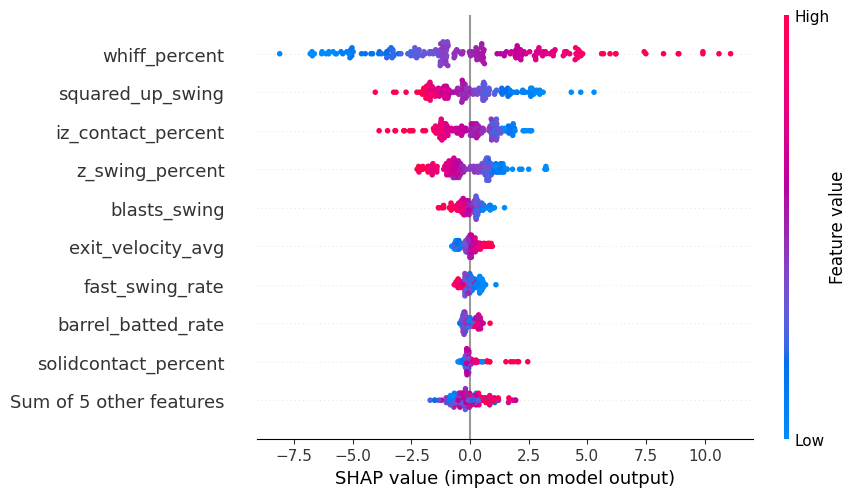

In [436]:
# Explain the model using SHAP
explainer = shap.Explainer(xgb_random.best_estimator_)
shap_values = explainer(X_test)
shap.plots.beeswarm(shap_values)

In [437]:
# XGBoost Regressor with Hyperparameter Tuning for Qualified Data
xgb_regressor_q = XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_random_q = RandomizedSearchCV(estimator=xgb_regressor_q, param_distributions=param_grid_xgb,
                                  cv=5, random_state=42, n_jobs=-1, n_iter=200, scoring='r2')
xgb_random_q.fit(X_q_train, y_q_train, eval_set=[(X_q_test, y_q_test)], verbose=False)
y_q_pred_xgb_random = xgb_random_q.predict(X_q_test)
print(f"Qualified XGBoost Regression (Randomized Search) - MAE: {mean_absolute_error(y_q_test, y_q_pred_xgb_random):.3f}, "
      f"MSE: {mean_squared_error(y_q_test, y_q_pred_xgb_random):.3f}, R2: {r2_score(y_q_test, y_q_pred_xgb_random):.3f}")
print(f"Best parameters: {xgb_random_q.best_params_}")
# print feature importances
xgb_importances_q = pd.DataFrame(xgb_random_q.best_estimator_.feature_importances_, index=X_q_train.columns, columns=['importance']).sort_values('importance', ascending=False)
print("Feature importances from XGBoost Regressor (Randomized Search) for Qualified Data:")
print(xgb_importances_q)

Qualified XGBoost Regression (Randomized Search) - MAE: 1.742, MSE: 5.210, R2: 0.797
Best parameters: {'subsample': 0.6, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.05, 'colsample_bytree': 0.6}
Feature importances from XGBoost Regressor (Randomized Search) for Qualified Data:
                      importance
whiff_percent           0.348646
iz_contact_percent      0.198803
squared_up_swing        0.131349
barrel_batted_rate      0.048425
avg_swing_speed         0.039065
z_swing_percent         0.038194
blasts_swing            0.028127
exit_velocity_avg       0.027089
solidcontact_percent    0.027072
oz_swing_percent        0.026378
avg_swing_length        0.025067
sweet_spot_percent      0.024779
launch_angle_avg        0.021102
fast_swing_rate         0.015906


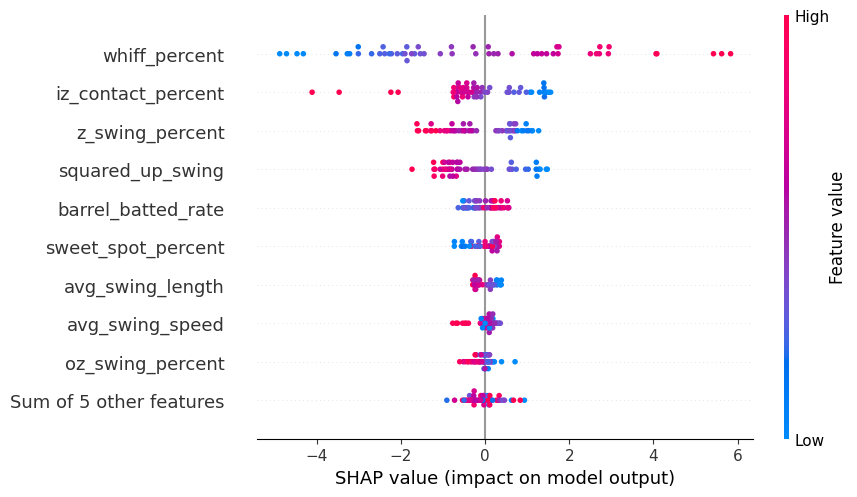

In [438]:
# Explain the model using SHAP for Qualified Data
explainer_q = shap.Explainer(xgb_random_q.best_estimator_)
shap_values_q = explainer_q(X_q_test)
shap.plots.beeswarm(shap_values_q)

### Compare

<Figure size 1200x800 with 0 Axes>

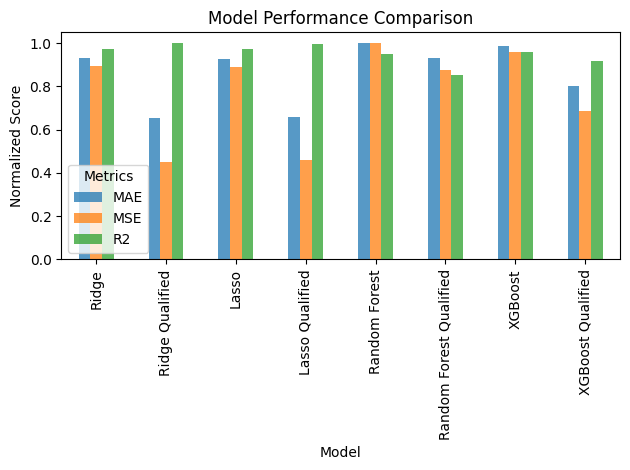

In [439]:
# Plot all MAE, MSE, and R2 scores
scores = {
    'Model': ['Ridge','Ridge Qualified', 
              'Lasso', 'Lasso Qualified', 
              'Random Forest', 'Random Forest Qualified', 
              'XGBoost', 'XGBoost Qualified'],
    'MAE': [mean_absolute_error(y_test, y_pred_ridge), mean_absolute_error(y_q_test, y_q_pred_ridge),
            mean_absolute_error(y_test, y_pred_lasso), mean_absolute_error(y_q_test, y_q_pred_lasso),
            mean_absolute_error(y_test, y_pred_rf_random), mean_absolute_error(y_q_test, y_q_pred_rf_random),
            mean_absolute_error(y_test, y_pred_xgb_random), mean_absolute_error(y_q_test, y_q_pred_xgb_random)],
    'MSE': [mean_squared_error(y_test, y_pred_ridge), mean_squared_error(y_q_test, y_q_pred_ridge),
            mean_squared_error(y_test, y_pred_lasso), mean_squared_error(y_q_test, y_q_pred_lasso),
            mean_squared_error(y_test, y_pred_rf_random), mean_squared_error(y_q_test, y_q_pred_rf_random),
            mean_squared_error(y_test, y_pred_xgb_random), mean_squared_error(y_q_test, y_q_pred_xgb_random)],
    'R2': [r2_score(y_test, y_pred_ridge), r2_score(y_q_test, y_q_pred_ridge),
           r2_score(y_test, y_pred_lasso), r2_score(y_q_test, y_q_pred_lasso),
           r2_score(y_test, y_pred_rf_random), r2_score(y_q_test, y_q_pred_rf_random),
           r2_score(y_test, y_pred_xgb_random), r2_score(y_q_test, y_q_pred_xgb_random)]
}
scores_df = pd.DataFrame(scores)
scores_df.set_index('Model', inplace=True)
# Normalize the scores
scores_df_normalized = scores_df.copy()
scores_df_normalized['MAE'] = scores_df_normalized['MAE'] / scores_df_normalized['MAE'].max()
scores_df_normalized['MSE'] = scores_df_normalized['MSE'] / scores_df_normalized['MSE'].max()
scores_df_normalized['R2'] = scores_df_normalized['R2'] / scores_df_normalized['R2'].max()
# Plotting
plt.figure(figsize=(12, 8))
scores_df_normalized.plot(kind='bar', alpha=0.75)
plt.title('Model Performance Comparison')
plt.ylabel('Normalized Score')
plt.legend(title='Metrics', loc='lower left')
plt.tight_layout()
plt.show()

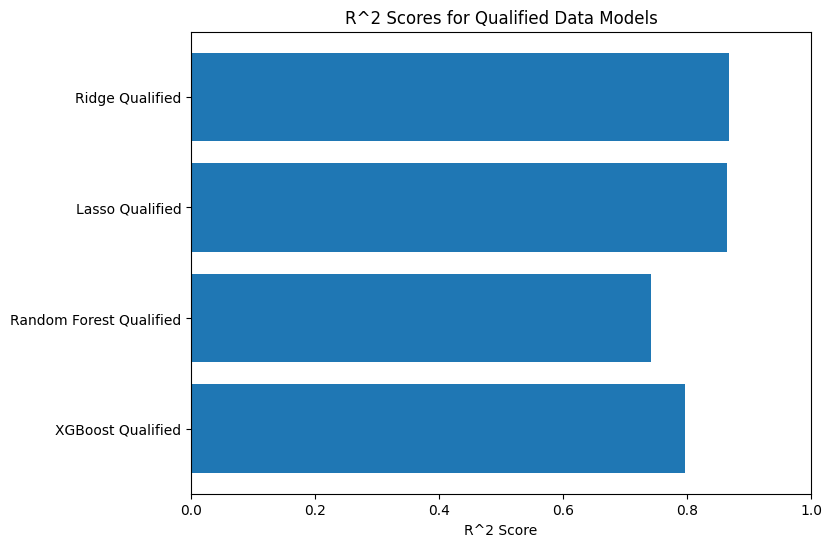

In [440]:
# Plot only non-normalized, qualified R^2 scores
plt.figure(figsize=(8, 6))
plt.barh(scores_df.index[1::2], scores_df['R2'][1::2])
plt.xlabel('R^2 Score')
plt.xlim(0, 1)
plt.title('R^2 Scores for Qualified Data Models')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score on top
plt.show()

<Figure size 1000x600 with 0 Axes>

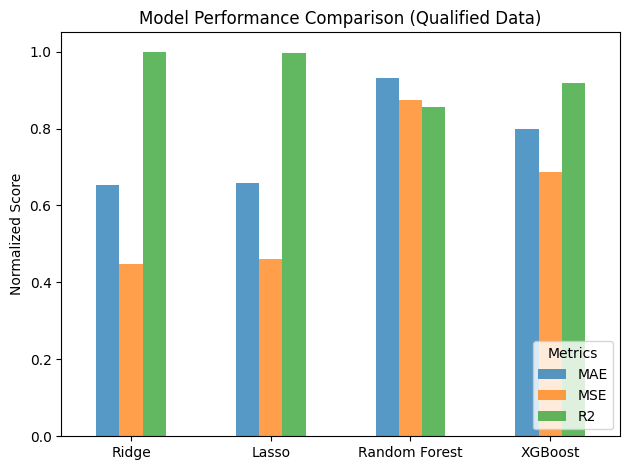

In [441]:
# Change model names to remove qualified
scores_df_normalized.index = ['Ridge', 'Ridge', 'Lasso', 'Lasso',
                             'Random Forest', 'Random Forest', 'XGBoost', 'XGBoost']
# Plot normalized scores, only qualified data
plt.figure(figsize=(10, 6))
scores_df_normalized.iloc[1::2].plot(kind='bar', alpha=0.75)
plt.title('Model Performance Comparison (Qualified Data)')
plt.ylabel('Normalized Score')
plt.legend(title='Metrics', loc='lower right')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [442]:
# Print Non-Normalized Scores
print("Scores:")
print(scores_df)

Scores:
                              MAE       MSE        R2
Model                                                
Ridge                    2.028619  6.780692  0.842233
Ridge Qualified          1.421167  3.408731  0.867109
Lasso                    2.018365  6.743604  0.843096
Lasso Qualified          1.435651  3.490993  0.863902
Random Forest            2.178300  7.595295  0.823280
Random Forest Qualified  2.026432  6.637825  0.741222
XGBoost                  2.151565  7.285337  0.830492
XGBoost Qualified        1.742364  5.210301  0.796874


### Lasso on K% with Swing + Stance, Plot Feature Importance

In [443]:
# Set X and Y for Swing Stats predicting k_percent
swing_columns = ['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                 'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                 'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']
stance_columns = ['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                  'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']
swing_stance_columns = swing_columns + stance_columns
X = data_qualified[swing_stance_columns].dropna()
y = data_qualified['k_percent'].dropna()
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# StandardScaler on the Data
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Convert back to DataFrames
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns, index=X_test.index)

Lasso Regression (Swing + Stance) - MAE: 1.469, MSE: 3.498, R2: 0.864
Important features selected by Lasso (Swing + Stance):
whiff_percent               4.377007
squared_up_swing           -1.667314
z_swing_percent            -1.548757
exit_velocity_avg           0.794004
fast_swing_rate            -0.506600
avg_stance_angle            0.374330
avg_swing_length           -0.366250
barrel_batted_rate         -0.272554
avg_intercept_y_vs_plate   -0.257465
sweet_spot_percent          0.241505
avg_batter_x_position      -0.236376
blasts_swing               -0.167856
launch_angle_avg            0.127860
avg_batter_y_position       0.108997
oz_swing_percent           -0.096631
avg_foot_sep               -0.011368
dtype: float64


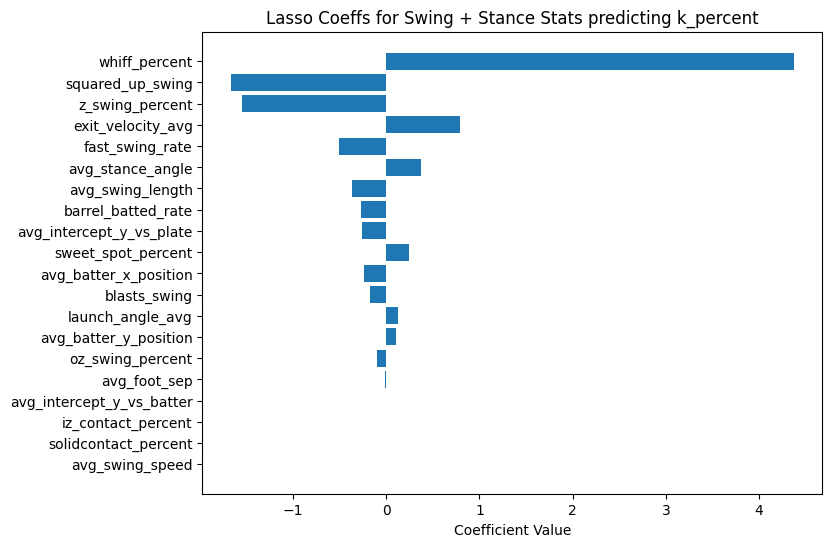

In [444]:
# Lasso Regression for Swing + Stance Stats predicting k_percent
lasso = LassoCV(alphas=np.logspace(-4, 1, 100), cv=5, max_iter=100000)
lasso.fit(X_train_scaled, y_train)
y_pred_lasso = lasso.predict(X_test_scaled)
print(f"Lasso Regression (Swing + Stance) - MAE: {mean_absolute_error(y_test, y_pred_lasso):.3f}, "
      f"MSE: {mean_squared_error(y_test, y_pred_lasso):.3f}, R2: {r2_score(y_test, y_pred_lasso):.3f}")
# Print feature importances
lasso_features = pd.Series(lasso.coef_, index=X_train.columns).sort_values(key=abs, ascending=True)
important_features = lasso_features[lasso_features != 0].sort_values(key=abs, ascending=False)
print("Important features selected by Lasso (Swing + Stance):")
print(important_features)
# Plot all features
plt.figure(figsize=(8, 6))
plt.barh(lasso_features.index, lasso_features.values)
plt.xlabel('Coefficient Value')
plt.title('Lasso Coeffs for Swing + Stance Stats predicting k_percent')
plt.show()

## Lasso Swing+Stance on All Offensive Outcomes

In [415]:
# Define columns of interest for predictors
swing_columns = ['avg_swing_speed', 'fast_swing_rate', 'blasts_swing', 'squared_up_swing', 'avg_swing_length', 'exit_velocity_avg',
                 'launch_angle_avg', 'sweet_spot_percent', 'barrel_batted_rate', 'solidcontact_percent',
                 'z_swing_percent', 'oz_swing_percent', 'iz_contact_percent', 'whiff_percent']
stance_columns = ['avg_batter_y_position', 'avg_batter_x_position', 'avg_foot_sep', 'avg_stance_angle',
                  'avg_intercept_y_vs_batter', 'avg_intercept_y_vs_plate']
swing_stance_columns = swing_columns + stance_columns
X = data_qualified[swing_stance_columns].dropna()

In [416]:
# Function to run full Lasso Regression
# Set y, Train-Test Split, Scale, Fit Model, Get Scores, Plot Feature Importances
def full_lasso_regression_from_swing_stance(target_column_name):
    # Set y
    y = data_qualified[target_column_name].dropna()
    
    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    # StandardScaler on the Data
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    # Convert back to DataFrames
    X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns, index=X_train.index)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns, index=X_test.index)
    
    # Lasso Regression
    lasso = LassoCV(alphas=np.logspace(-4, 1, 100), cv=5, max_iter=100000)
    lasso.fit(X_train_scaled, y_train)
    y_pred_lasso = lasso.predict(X_test_scaled)
    mae_value = mean_absolute_error(y_test, y_pred_lasso)
    mse_value = mean_squared_error(y_test, y_pred_lasso)
    r2_score_value = r2_score(y_test, y_pred_lasso)
    
    # Plot feature importances
    lasso_features = pd.Series(lasso.coef_, index=X_train.columns).sort_values(key=abs, ascending=True)
    plt.figure(figsize=(9, 5))
    plt.barh(lasso_features.index, lasso_features.values)
    plt.xlabel('Coefficient Value')
    plt.title(f'Lasso Coeffs for Swing+Stance on {target_column_name}, MAE: {mae_value:.2f}, MSE: {mse_value:.2f}, R2: {r2_score_value:.2f}')
    plt.show()
    
    return mae_value, mse_value, r2_score_value, lasso_features

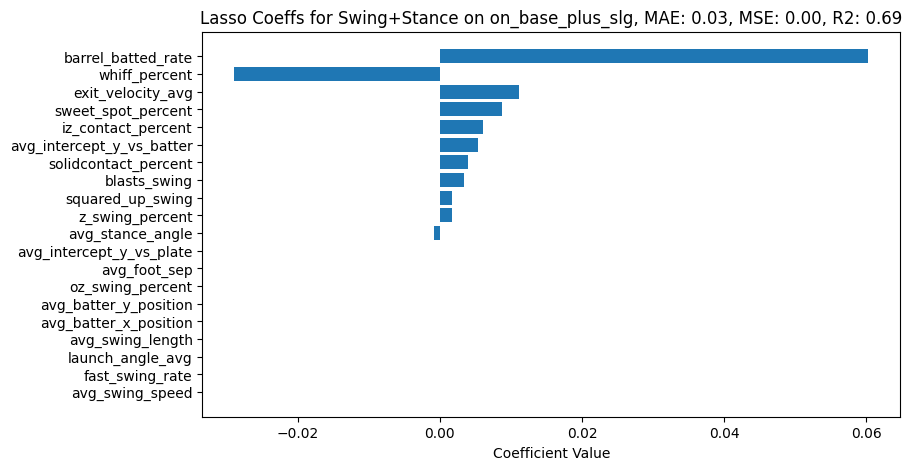

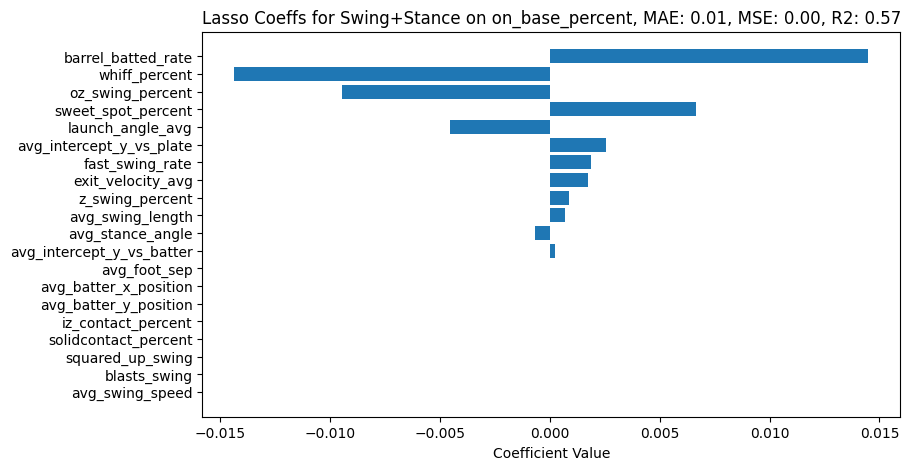

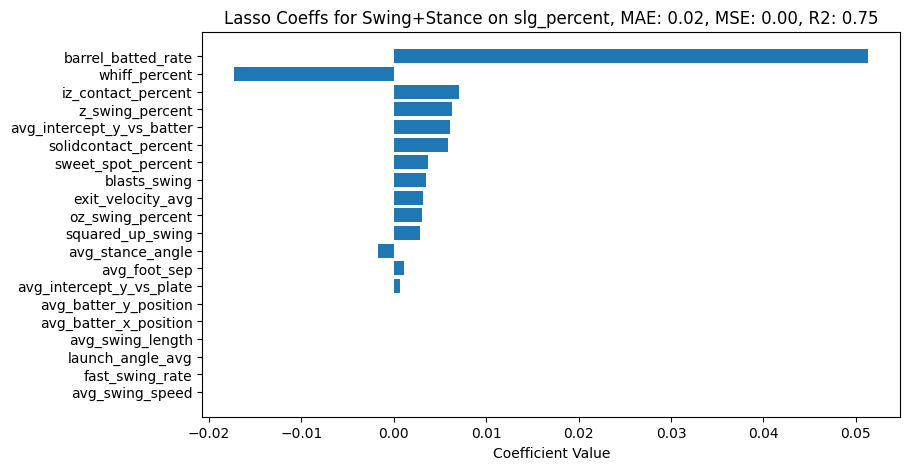

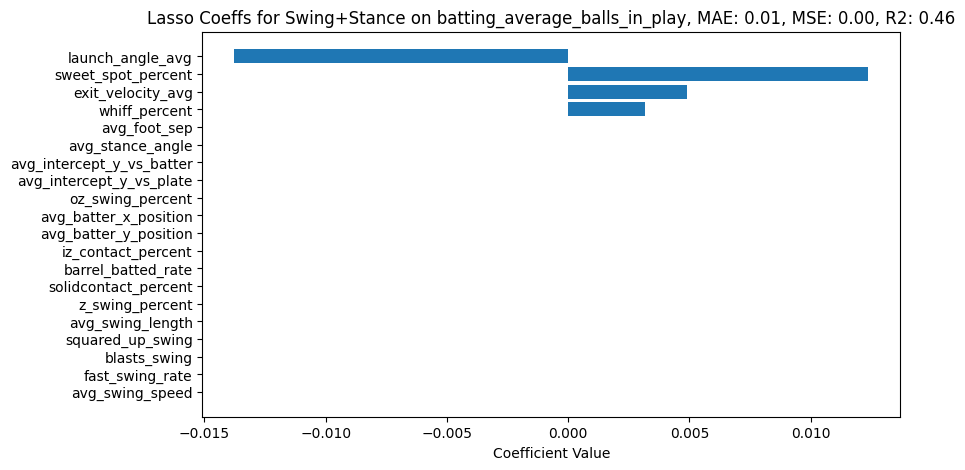

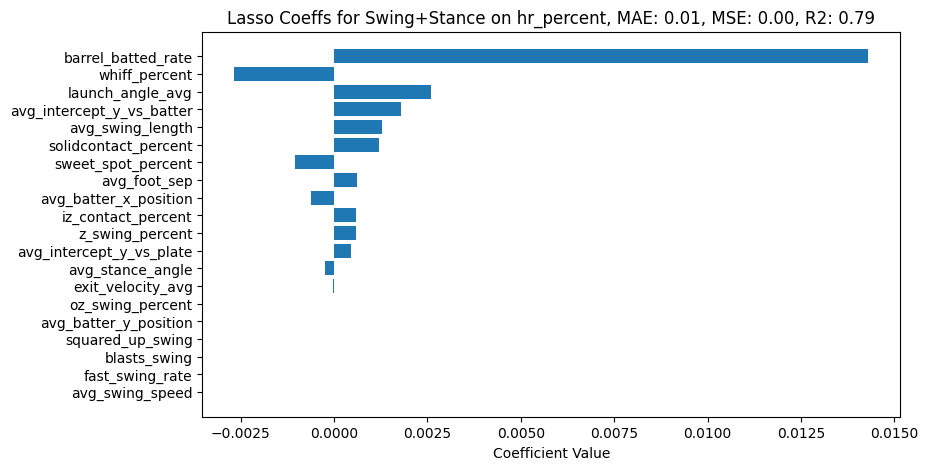

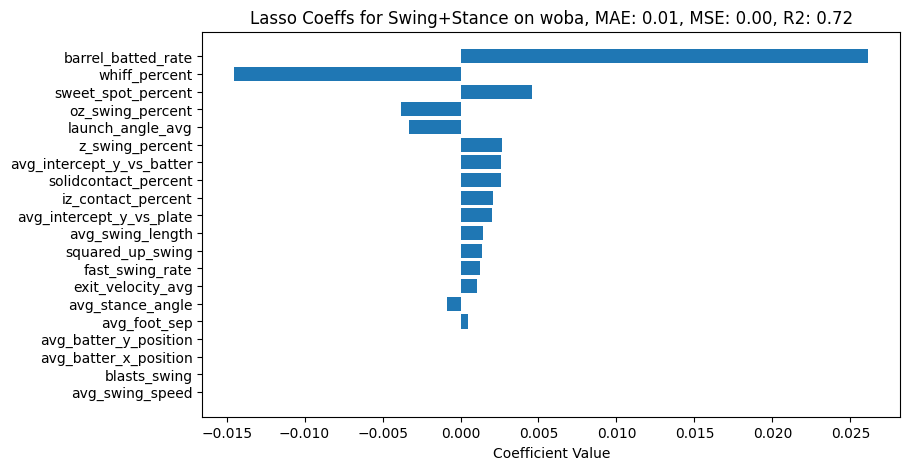

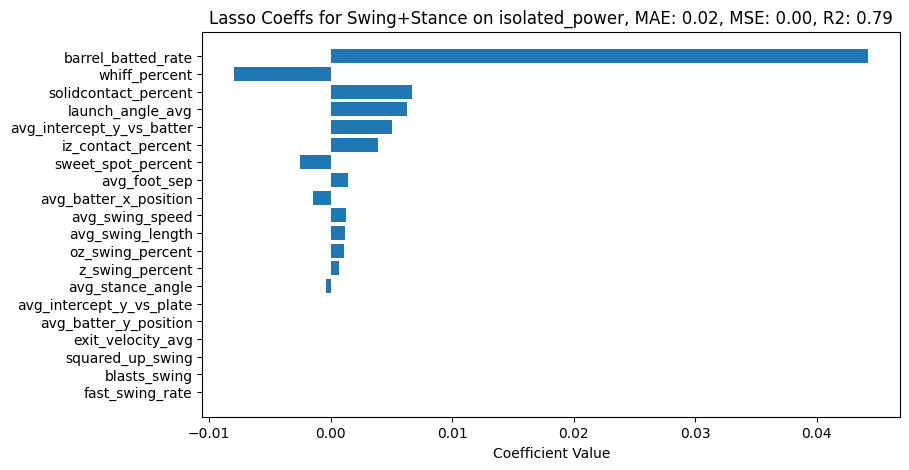

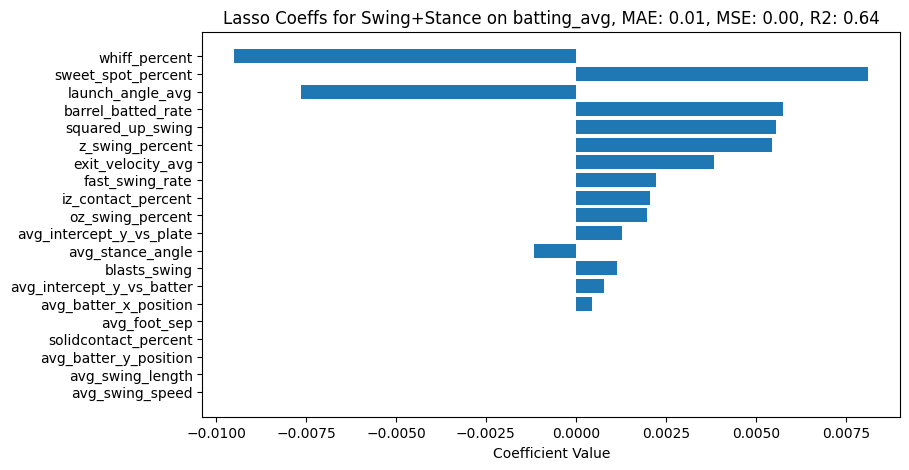

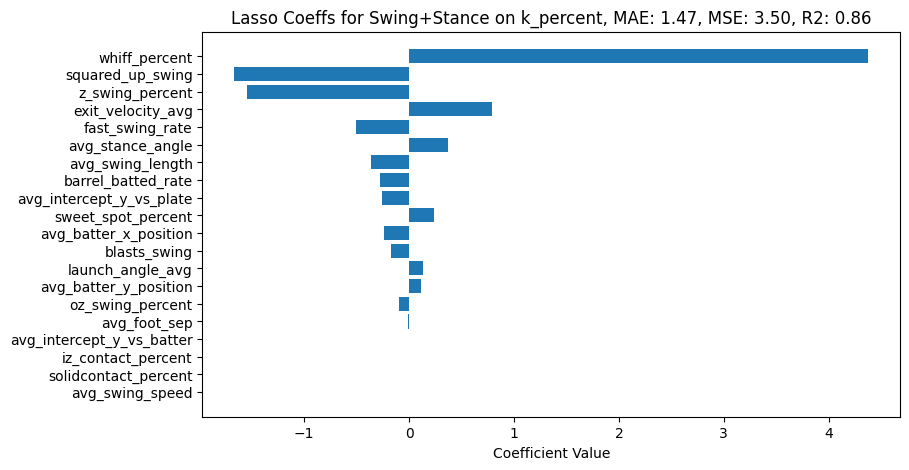

In [417]:
# All Offensive Outcomes
outcomes_columns = ['on_base_plus_slg', 'on_base_percent', 'slg_percent', 'batting_average_balls_in_play', 'hr_percent',
                    'woba', 'isolated_power', 'batting_avg', 'k_percent']
scores = []
feature_importances = {}
for outcome in outcomes_columns:
    mae_value, mse_value, r2_score_value, lasso_features = full_lasso_regression_from_swing_stance(outcome)
    scores.append((outcome, mae_value, mse_value, r2_score_value))
    feature_importances[outcome] = lasso_features

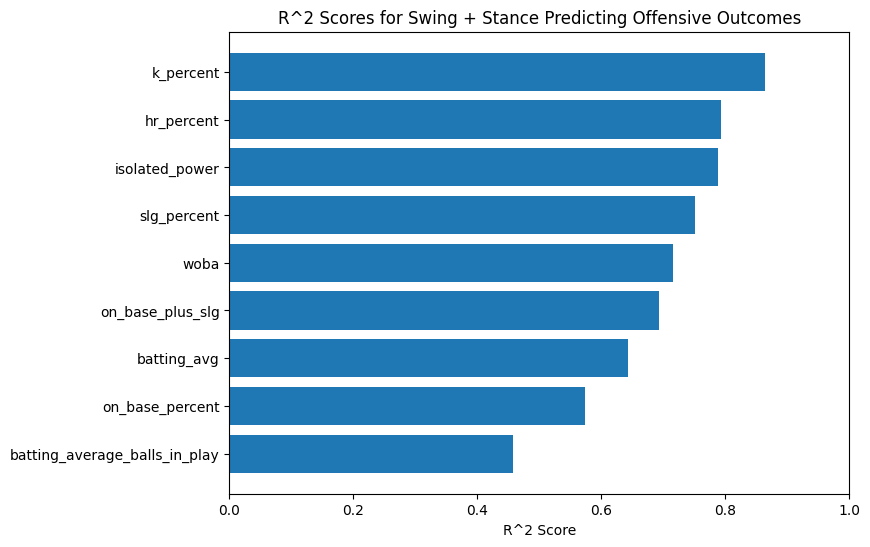

In [418]:
# Sort by R^2
scores.sort(key=lambda x: x[3], reverse=True)
# Plot R^2 scores
plt.figure(figsize=(8, 6))
plt.barh([outcome for outcome, _, _, _ in scores], [r2_score_value for _, _, _, r2_score_value in scores])
plt.xlabel('R^2 Score')
plt.xlim(0, 1)
plt.title('R^2 Scores for Swing + Stance Predicting Offensive Outcomes')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score on top
plt.show()

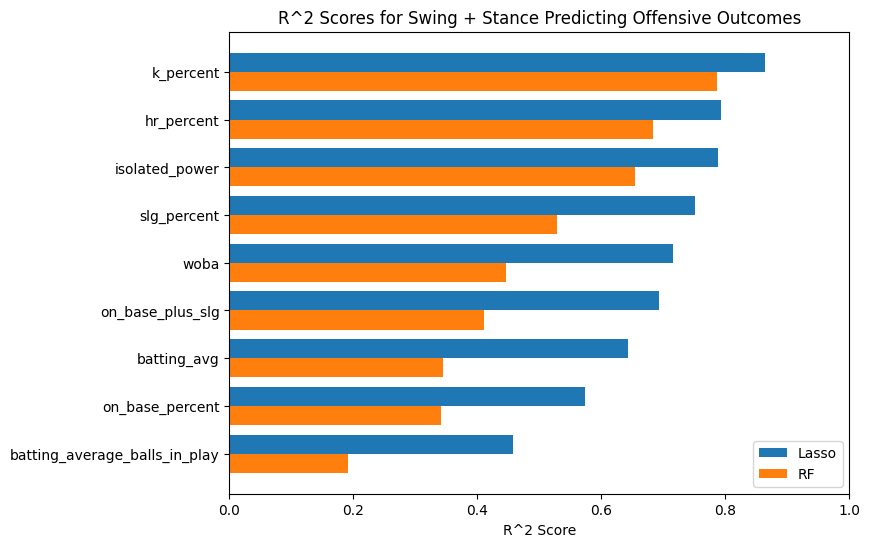

In [419]:
# Plot R^2 scores compared to scores from scores_quick_rf_q, side by side
bar_width = 0.4  # Width of each bar
indices = np.arange(len(scores))  # Positions for the bars

plt.figure(figsize=(8, 6))
plt.barh(indices - bar_width / 2, [r2_score_value for _, _, _, r2_score_value in scores], bar_width, label='Lasso')
plt.barh(indices + bar_width / 2, [score for _, score in scores_quick_rf_q], bar_width, label='RF')

plt.yticks(indices, [outcome for outcome, _, _, _ in scores])
plt.xlabel('R^2 Score')
plt.xlim(0, 1)
plt.title('R^2 Scores for Swing + Stance Predicting Offensive Outcomes')
plt.legend()
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score on top
plt.show()

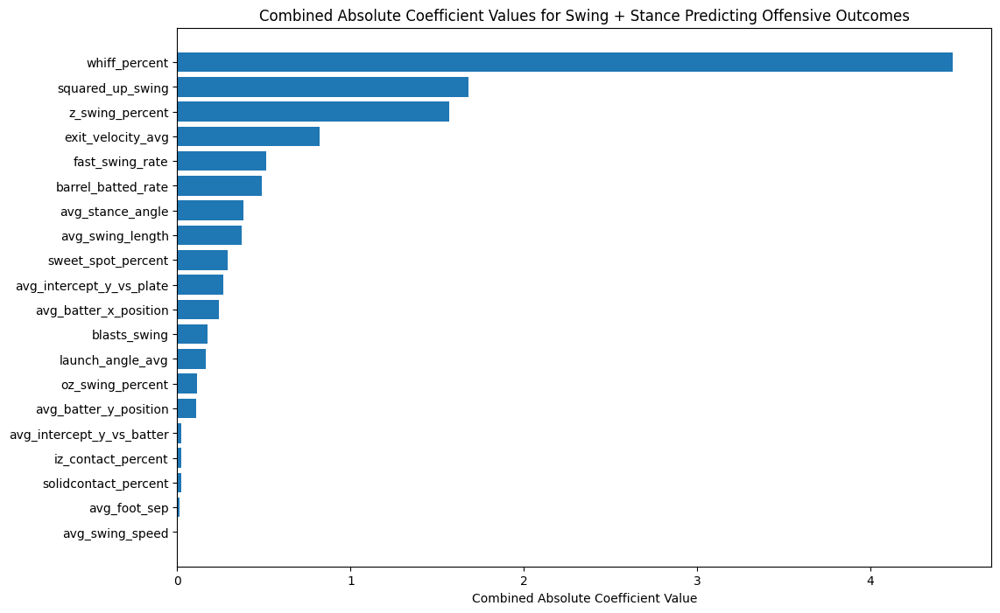

In [420]:
# Get combined absolute values of coefficients and plot
combined_importances = pd.DataFrame()
for outcome, lasso_features in feature_importances.items():
    combined_importances[outcome] = lasso_features.abs()
combined_importances = combined_importances.sum(axis=1).sort_values(ascending=True)
plt.figure(figsize=(12, 8))
plt.barh(combined_importances.index, combined_importances.values)
plt.xlabel('Combined Absolute Coefficient Value')
plt.title('Combined Absolute Coefficient Values for Swing + Stance Predicting Offensive Outcomes')
plt.show()

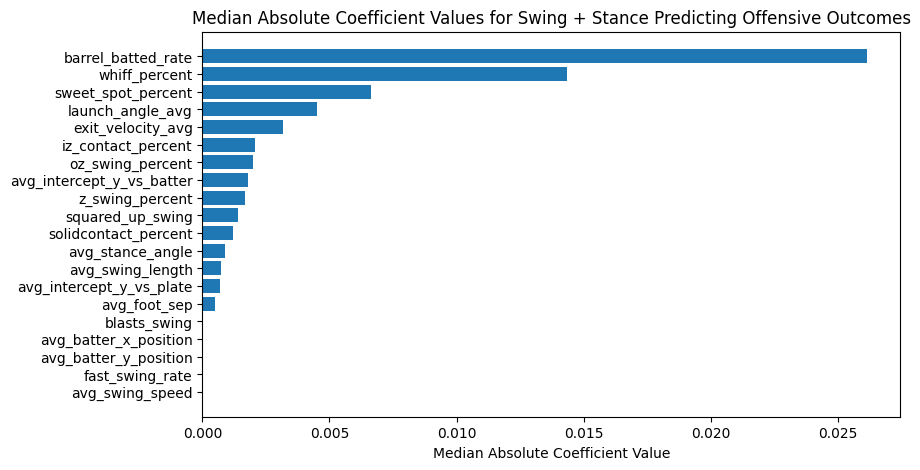

In [422]:
# Get median absolute values of coefficients and plot
average_importances = pd.DataFrame()
for outcome, lasso_features in feature_importances.items():
    average_importances[outcome] = lasso_features.abs()
average_importances = average_importances.median(axis=1).sort_values(ascending=True)
plt.figure(figsize=(9, 5))
plt.barh(average_importances.index, average_importances.values)
plt.xlabel('Median Absolute Coefficient Value')
plt.title('Median Absolute Coefficient Values for Swing + Stance Predicting Offensive Outcomes')
plt.show()

# Lasso Swing+Stance on Pitch-Type Outcomes

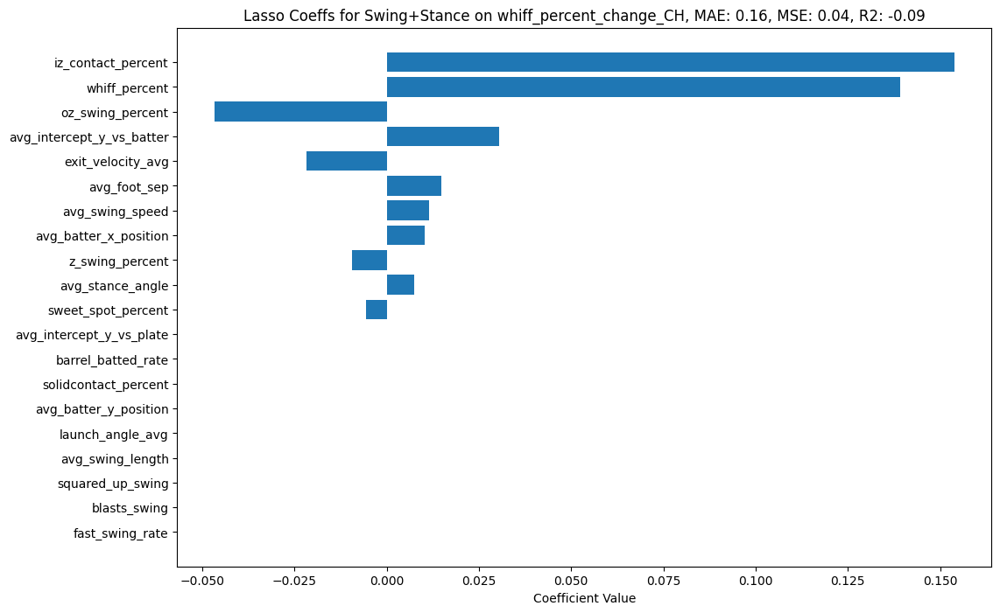

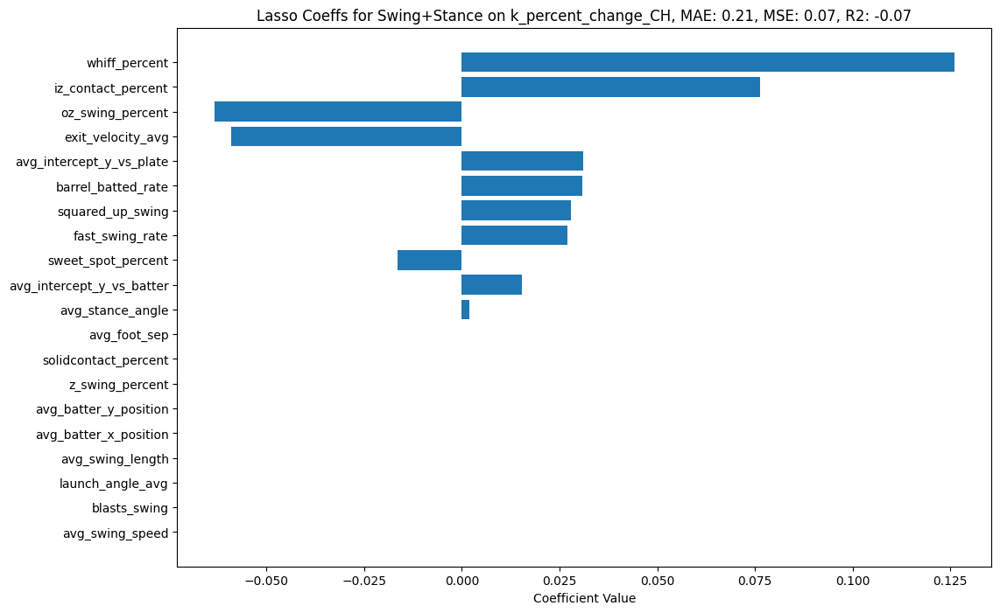

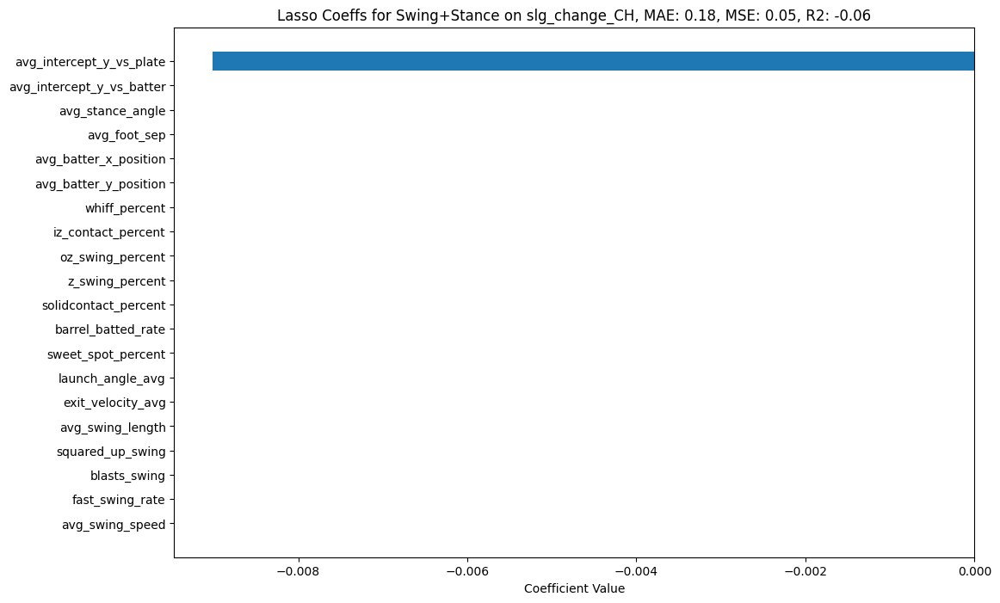

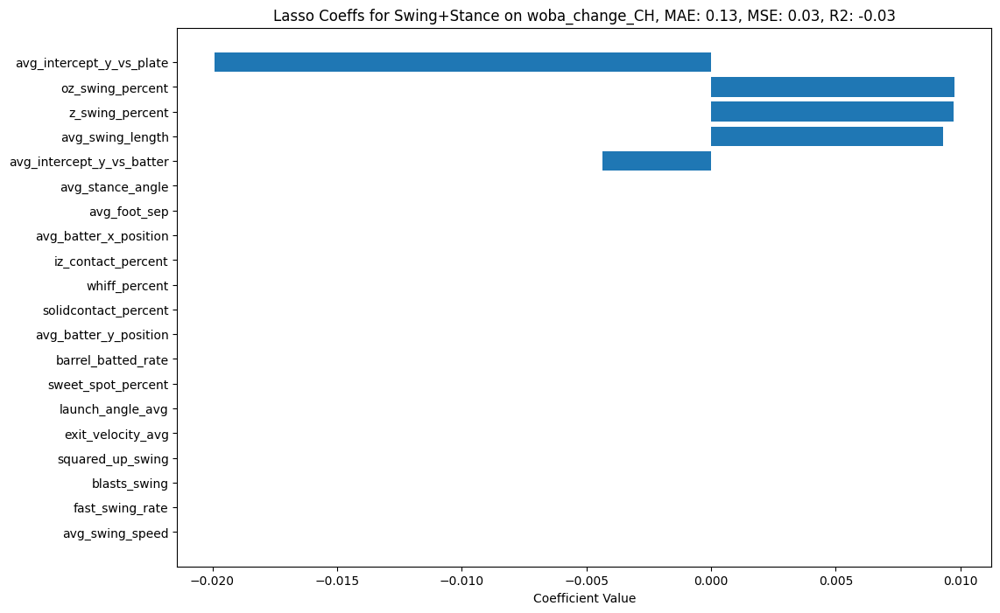

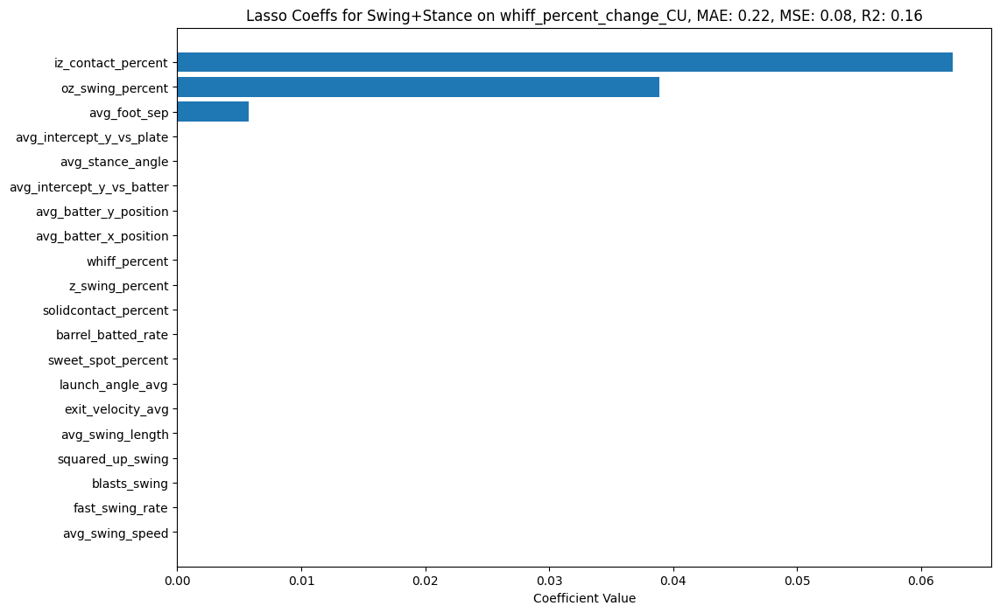

...

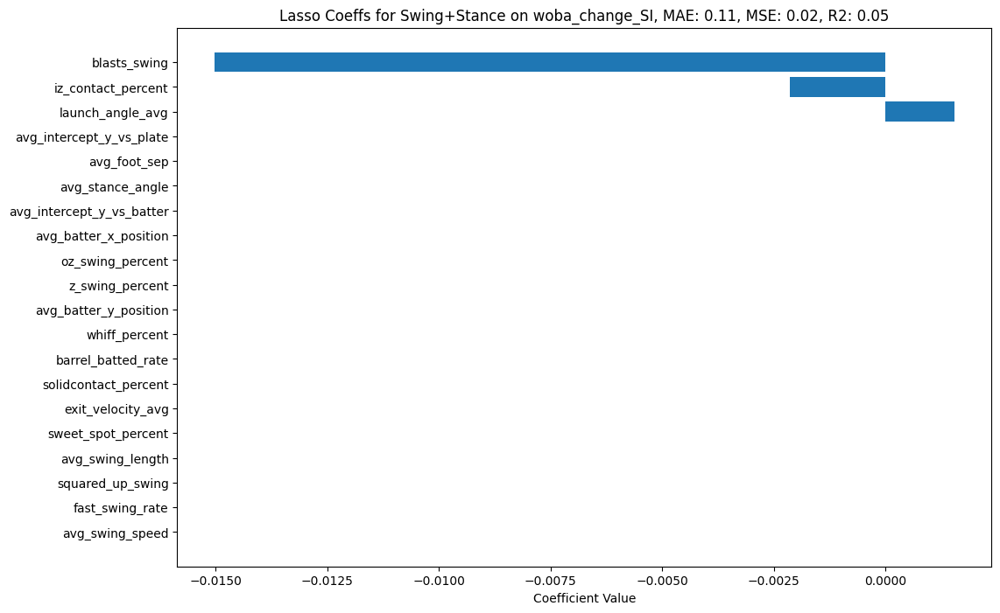

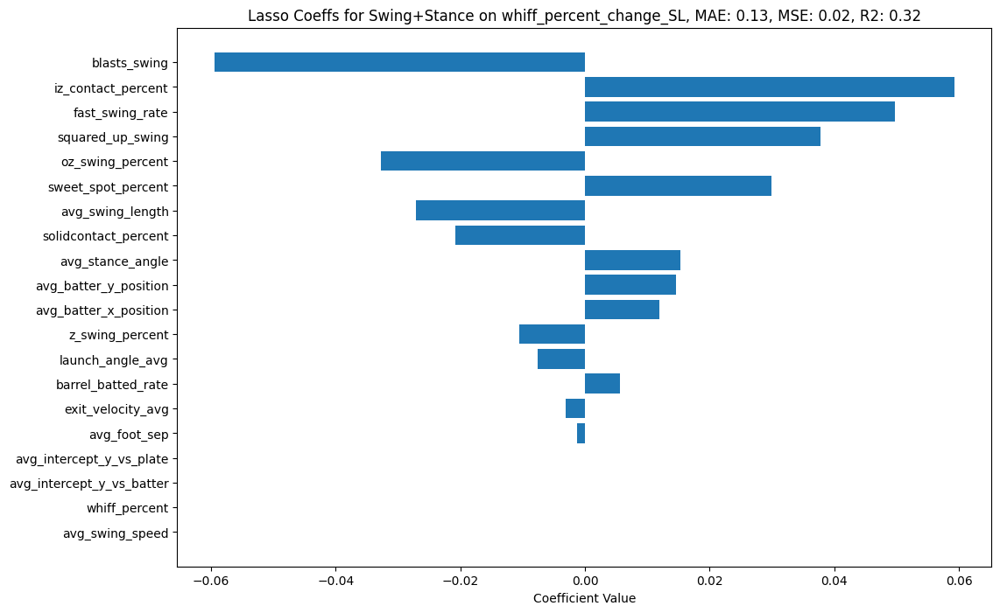

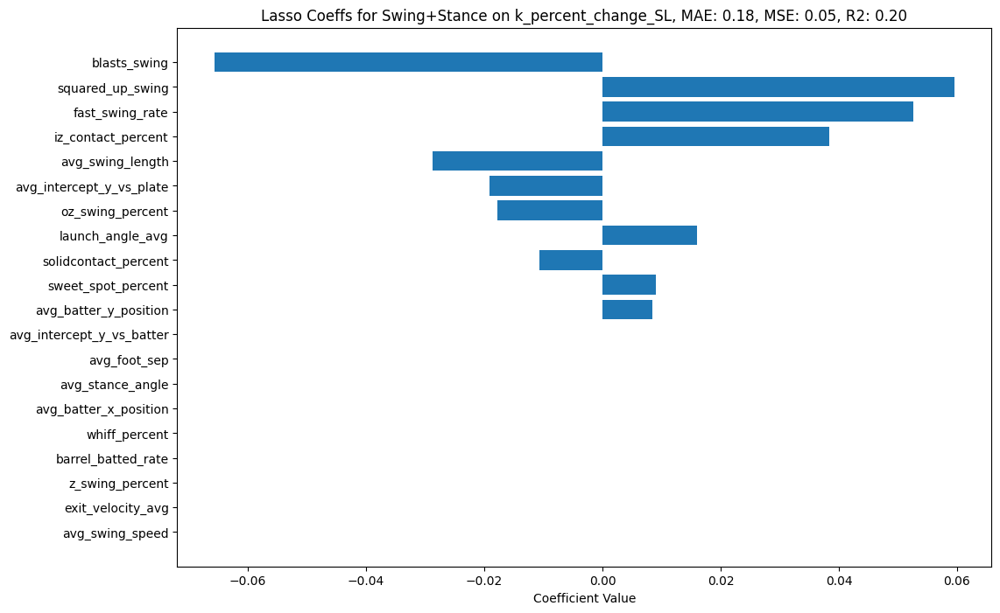

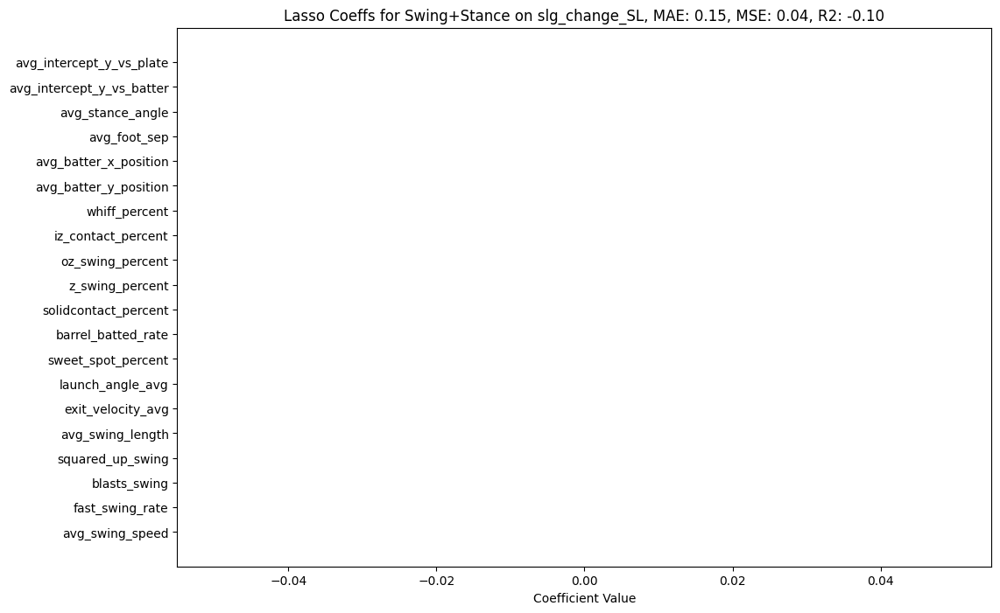

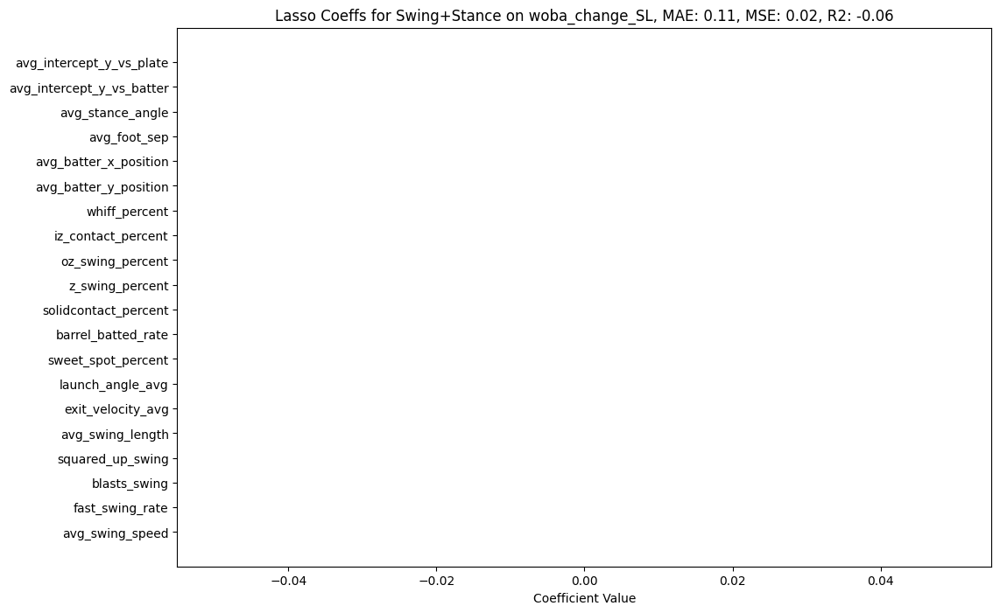

In [292]:
# All Pitch-Type Outcomes
pitch_type_columns = ['whiff_percent_change_CH', 'k_percent_change_CH', 'slg_change_CH',
                      'woba_change_CH', 'whiff_percent_change_CU', 'k_percent_change_CU',
                      'slg_change_CU', 'woba_change_CU', 'whiff_percent_change_FC',
                      'k_percent_change_FC', 'slg_change_FC', 'woba_change_FC',
                      'whiff_percent_change_FF', 'k_percent_change_FF', 'slg_change_FF',
                      'woba_change_FF', 'whiff_percent_change_SI', 'k_percent_change_SI',
                      'slg_change_SI', 'woba_change_SI', 'whiff_percent_change_SL',
                      'k_percent_change_SL', 'slg_change_SL', 'woba_change_SL']
for pitch_type in pitch_type_columns:
    full_lasso_regression_from_swing_stance(pitch_type)